Flight Delay Distribution Prediction
==============

**Author:** *Nicolas Haase*

# 0 Environment Insights

In [1]:
from subprocess import check_output
from psutil import virtual_memory

# RAM
ram = virtual_memory()

total_ram_gb = ram.total / (1024 ** 3)
available_ram_gb = ram.available / (1024 ** 3)
used_ram_gb = ram.used / (1024 ** 3)

print(f"Total RAM: {total_ram_gb:.2f} GB")
print(f"Available RAM: {available_ram_gb:.2f} GB")
print(f"Used RAM: {used_ram_gb:.2f} GB")
print("RAM Usage Percentage:", ram.percent, "%")

# GPU
output = check_output(['system_profiler', 'SPDisplaysDataType'])

print(output.decode('utf-8'))

Total RAM: 16.00 GB
Available RAM: 7.21 GB
Used RAM: 7.07 GB
RAM Usage Percentage: 54.9 %
Graphics/Displays:

    Intel HD Graphics 630:

      Chipset Model: Intel HD Graphics 630
      Type: GPU
      Bus: Built-In
      VRAM (Dynamic, Max): 1536 MB
      Vendor: Intel
      Device ID: 0x591b
      Revision ID: 0x0004
      Automatic Graphics Switching: Supported
      gMux Version: 4.0.29 [3.2.8]
      Metal Support: Metal 3
      Displays:
        Color LCD:
          Display Type: Built-In Retina LCD
          Resolution: 2880 x 1800 Retina
          Framebuffer Depth: 24-Bit Color (ARGB8888)
          Main Display: Yes
          Mirror: Off
          Online: Yes
          Automatically Adjust Brightness: Yes
          Connection Type: Internal

    Radeon Pro 555:

      Chipset Model: Radeon Pro 555
      Type: GPU
      Bus: PCIe
      PCIe Lane Width: x8
      VRAM (Total): 2 GB
      Vendor: AMD (0x1002)
      Device ID: 0x67ef
      Revision ID: 0x00c7
      ROM Revision: 11

# 1 Setup

## 1.1 Used Libraries

In [162]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import utils as ut
import numpy as np
import pandas as pd
import properscoring as ps
import statsmodels.api as sm
from scipy.stats import norm
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

## 1.2 Data Import

In [3]:
# Load data into a DataFrame
df = pd.read_csv('../data/cleaned/atl_cleaned.csv')

## 1.3 Workspace Settings

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## 1.4 Feature Preprocessing

In [5]:
# Rename the column "DayofMonth" to "DayOfMonth"
df.rename(columns={"DayofMonth": "DayOfMonth"}, inplace=True)

# Convert "FlightDate" to Date object
# df_filtered['FlightDate'] = pd.to_datetime(df_filtered['FlightDate'])

# 2 Exploratory Data Analysis

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1276177 entries, 0 to 1276176
Data columns (total 39 columns):
 #   Column                           Non-Null Count    Dtype  
---  ------                           --------------    -----  
 0   Year                             1276177 non-null  int64  
 1   Month                            1276177 non-null  int64  
 2   DayOfMonth                       1276177 non-null  int64  
 3   DayOfWeek                        1276177 non-null  int64  
 4   FlightDate                       1276177 non-null  object 
 5   Reporting_Airline                1276177 non-null  object 
 6   Tail_Number                      1276177 non-null  object 
 7   Flight_Number_Reporting_Airline  1276177 non-null  int64  
 8   OriginAirportID                  1276177 non-null  int64  
 9   Origin                           1276177 non-null  object 
 10  DestAirportID                    1276177 non-null  int64  
 11  Dest                             1276177 non-null 

In [7]:
# Print the first ten rows to get an overview
df.head(10)

,Year,Month,DayOfMonth,DayOfWeek,FlightDate,Reporting_Airline,Tail_Number,Flight_Number_Reporting_Airline,OriginAirportID,Origin,DestAirportID,Dest,CRSDepTime,DepTime,DepDelay,DepDel15,DepartureDelayGroups,DepTimeBlk,TaxiOut,WheelsOff,WheelsOn,TaxiIn,CRSArrTime,ArrTime,ArrDelay,ArrDel15,ArrivalDelayGroups,ArrTimeBlk,CRSElapsedTime,ActualElapsedTime,AirTime,Flights,Distance,DistanceGroup,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,2021,8,21,6,2021-08-21,OH,N541EA,5622,10397,ATL,11278,DCA,1630,1628.0,-2.0,0.0,-1.0,1600-1659,25.0,1653.0,1814.0,3.0,1830,1817.0,-13.0,0.0,-1.0,1800-1859,120.0,109.0,81.0,1.0,547.0,3,NaN,NaN,NaN,NaN,NaN
1,2021,8,28,6,2021-08-28,OH,N562NN,5622,10397,ATL,11278,DCA,1630,1624.0,-6.0,0.0,-1.0,1600-1659,18.0,1642.0,1756.0,3.0,1830,1759.0,-31.0,0.0,-2.0,1800-1859,120.0,95.0,74.0,1.0,547.0,3,NaN,NaN,NaN,NaN,NaN
2,2021,8,21,6,2021-08-21,OH,N541EA,5622,11278,DCA,10397,ATL,1350,1348.0,-2.0,0.0,-1.0,1300-1359,30.0,1418.0,1535.0,7.0,1547,1542.0,-5.0,0.0,-1.0,1500-1559,117.0,114.0,77.0,1.0,547.0,3,NaN,NaN,NaN,NaN,NaN
3,2021,8,28,6,2021-08-28,OH,N562NN,5622,11278,DCA,10397,ATL,1350,1344.0,-6.0,0.0,-1.0,1300-1359,17.0,1401.0,1525.0,8.0,1547,1533.0,-14.0,0.0,-1.0,1500-1559,117.0,109.0,84.0,1.0,547.0,3,NaN,NaN,NaN,NaN,NaN
4,2021,8,21,6,2021-08-21,OO,N144SY,5274,12266,IAH,10397,ATL,950,947.0,-3.0,0.0,-1.0,0900-0959,17.0,1004.0,1244.0,10.0,1256,1254.0,-2.0,0.0,-1.0,1200-1259,126.0,127.0,100.0,1.0,689.0,3,NaN,NaN,NaN,NaN,NaN
5,2021,8,21,6,2021-08-21,OO,N144SY,5651,10397,ATL,13930,ORD,1340,1335.0,-5.0,0.0,-1.0,1300-1359,23.0,1358.0,1434.0,7.0,1454,1441.0,-13.0,0.0,-1.0,1400-1459,134.0,126.0,96.0,1.0,606.0,3,NaN,NaN,NaN,NaN,NaN
6,2021,8,20,5,2021-08-20,OO,N142SY,5336,13930,ORD,10397,ATL,1755,1748.0,-7.0,0.0,-1.0,1700-1759,17.0,1805.0,2033.0,4.0,2107,2037.0,-30.0,0.0,-2.0,2100-2159,132.0,109.0,88.0,1.0,606.0,3,NaN,NaN,NaN,NaN,NaN
7,2021,8,26,4,2021-08-26,OO,N163SY,5284,10397,ATL,13930,ORD,645,647.0,2.0,0.0,0.0,0600-0659,11.0,658.0,734.0,12.0,759,746.0,-13.0,0.0,-1.0,0700-0759,134.0,119.0,96.0,1.0,606.0,3,NaN,NaN,NaN,NaN,NaN
8,2021,8,28,6,2021-08-28,OO,N135SY,5284,10397,ATL,13930,ORD,645,744.0,59.0,1.0,3.0,0600-0659,14.0,758.0,825.0,13.0,759,838.0,39.0,1.0,2.0,0700-0759,134.0,114.0,87.0,1.0,606.0,3,39.0,0.0,0.0,0.0,0.0
9,2021,8,28,6,2021-08-28,OO,N204SY,5651,10397,ATL,13930,ORD,1340,1335.0,-5.0,0.0,-1.0,1300-1359,21.0,1356.0,1427.0,13.0,1454,1440.0,-14.0,0.0,-1.0,1400-1459,134.0,125.0,91.0,1.0,606.0,3,NaN,NaN,NaN,NaN,NaN


In [8]:
print(df.dtypes)

Year                                 int64
Month                                int64
DayOfMonth                           int64
DayOfWeek                            int64
FlightDate                          object
Reporting_Airline                   object
Tail_Number                         object
Flight_Number_Reporting_Airline      int64
OriginAirportID                      int64
Origin                              object
DestAirportID                        int64
Dest                                object
CRSDepTime                           int64
DepTime                            float64
DepDelay                           float64
DepDel15                           float64
DepartureDelayGroups               float64
DepTimeBlk                          object
TaxiOut                            float64
WheelsOff                          float64
WheelsOn                           float64
TaxiIn                             float64
CRSArrTime                           int64
ArrTime    

In [9]:
# Print the columns
print(list(df))

['Year', 'Month', 'DayOfMonth', 'DayOfWeek', 'FlightDate', 'Reporting_Airline', 'Tail_Number', 'Flight_Number_Reporting_Airline', 'OriginAirportID', 'Origin', 'DestAirportID', 'Dest', 'CRSDepTime', 'DepTime', 'DepDelay', 'DepDel15', 'DepartureDelayGroups', 'DepTimeBlk', 'TaxiOut', 'WheelsOff', 'WheelsOn', 'TaxiIn', 'CRSArrTime', 'ArrTime', 'ArrDelay', 'ArrDel15', 'ArrivalDelayGroups', 'ArrTimeBlk', 'CRSElapsedTime', 'ActualElapsedTime', 'AirTime', 'Flights', 'Distance', 'DistanceGroup', 'CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay', 'LateAircraftDelay']


In [10]:
df.describe()

,Year,Month,DayOfMonth,DayOfWeek,Flight_Number_Reporting_Airline,OriginAirportID,DestAirportID,CRSDepTime,DepTime,DepDelay,DepDel15,DepartureDelayGroups,TaxiOut,WheelsOff,WheelsOn,TaxiIn,CRSArrTime,ArrTime,ArrDelay,ArrDel15,ArrivalDelayGroups,CRSElapsedTime,ActualElapsedTime,AirTime,Flights,Distance,DistanceGroup,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
count,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1.276177e+06,1276177.0,1.276177e+06,1.276177e+06,223100.000000,223100.000000,223100.000000,223100.000000,223100.000000
mean,2.022089e+03,6.554138e+00,1.575374e+01,3.965332e+00,2.144814e+03,1.158039e+04,1.158028e+04,1.343121e+03,1.343225e+03,1.070045e+01,1.866332e-01,4.812734e-02,1.565277e+01,1.362222e+03,1.440923e+03,7.519022e+00,1.467917e+03,1.442453e+03,4.343157e+00,1.748190e-01,-2.655940e-01,1.234848e+02,1.171254e+02,9.395357e+01,1.0,6.674630e+02,3.146042e+00,31.276190,3.672403,10.456114,0.158391,20.104890
std,7.089734e-01,3.401346e+00,8.765699e+00,2.004808e+00,1.402641e+03,1.598839e+03,1.598972e+03,5.072556e+02,5.213320e+02,4.693250e+01,3.896170e-01,2.091794e+00,7.564673e+00,5.239046e+02,5.442916e+02,5.536742e+00,5.318805e+02,5.496501e+02,4.865641e+01,3.798124e-01,2.209819e+00,5.918160e+01,5.945961e+01,5.756855e+01,0.0,4.914569e+02,1.893877e+00,78.894703,31.253915,27.469452,4.753562,46.280708
min,2.021000e+03,1.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,1.013500e+04,1.013500e+04,1.000000e+00,1.000000e+00,-9.000000e+01,0.000000e+00,-2.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,-9.000000e+01,0.000000e+00,-2.000000e+00,3.800000e+01,3.000000e+01,1.600000e+01,1.0,8.300000e+01,1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.022000e+03,4.000000e+00,8.000000e+00,2.000000e+00,1.068000e+03,1.039700e+04,1.039700e+04,9.140000e+02,9.140000e+02,-4.000000e+00,0.000000e+00,-1.000000e+00,1.100000e+01,9.270000e+02,1.023000e+03,5.000000e+00,1.040000e+03,1.025000e+03,-1.400000e+01,0.000000e+00,-1.000000e+00,8.500000e+01,7.900000e+01,5.800000e+01,1.0,3.560000e+02,2.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.022000e+03,7.000000e+00,1.600000e+01,4.000000e+00,2.022000e+03,1.039700e+04,1.039700e+04,1.325000e+03,1.328000e+03,-1.000000e+00,0.000000e+00,-1.000000e+00,1.400000e+01,1.338000e+03,1.439000e+03,6.000000e+00,1.454000e+03,1.441000e+03,-6.000000e+00,0.000000e+00,-1.000000e+00,1.110000e+02,1.040000e+02,8.200000e+01,1.0,5.660000e+02,3.000000e+00,10.000000,0.000000,0.000000,0.000000,0.000000
75%,2.023000e+03,9.000000e+00,2.300000e+01,6.000000e+00,2.737000e+03,1.289200e+04,1.289200e+04,1.747000e+03,1.753000e+03,7.000000e+00,0.000000e+00,0.000000e+00,1.800000e+01,1.806000e+03,1.910000e+03,9.000000e+00,1.920000e+03,1.912000e+03,6.000000e+00,0.000000e+00,0.000000e+00,1.370000e+02,1.310000e+02,1.060000e+02,1.0,7.600000e+02,4.000000e+00,31.000000,0.000000,13.000000,0.000000,23.000000
max,2.023000e+03,1.200000e+01,3.100000e+01,7.000000e+00,8.819000e+03,1.591900e+04,1.591900e+04,2.359000e+03,2.400000e+03,3.221000e+03,1.000000e+00,1.200000e+01,1.770000e+02,2.400000e+03,2.400000e+03,2.070000e+02,2.359000e+03,2.400000e+03,3.237000e+03,1.000000e+00,1.200000e+01,6.240000e+02,7.190000e+02,6.300000e+02,1.0,4.502000e+03,1.100000e+01,3221.000000,1280.000000,1300.000000,1132.000000,2216.000000


In [11]:
print(df.shape)

(1276177, 39)


In [12]:
# Get all unique values from the "Origin" column
num_unique_values = df['Origin'].nunique()
unique_values = sorted(df['Origin'].unique())

# Print the unique values
print("Number of unique values in the 'Origin' column:", num_unique_values)
print("Unique values in the 'Origin' column:")
for value in unique_values:
    print(value, end=", ")

Number of unique values in the 'Origin' column: 163
Unique values in the 'Origin' column:
ABE, ABQ, ABY, ACY, AEX, AGS, ALB, ANC, ASE, ATL, ATW, AUS, AVL, BDL, BGR, BHM, BMI, BNA, BOI, BOS, BQK, BTR, BTV, BUF, BWI, BZN, CAE, CHA, CHO, CHS, CID, CLE, CLT, CMH, COS, CRW, CSG, CVG, DAB, DAL, DAY, DCA, DEN, DFW, DHN, DSM, DTW, ECP, EGE, ELP, EVV, EWR, EYW, FAY, FCA, FLL, FSD, FWA, GEG, GNV, GPT, GRB, GRR, GSO, GSP, GTR, HDN, HHH, HNL, HOU, HPN, HSV, IAD, IAH, ICT, ILM, IND, ISP, JAC, JAN, JAX, JFK, LAS, LAX, LEX, LFT, LGA, LIT, MCI, MCO, MDT, MDW, MEM, MGM, MIA, MKE, MLB, MLI, MLU, MOB, MSN, MSO, MSP, MSY, MTJ, MYR, OAJ, OAK, OGG, OKC, OMA, ONT, ORD, ORF, PBI, PDX, PHL, PHX, PIT, PNS, PSP, PVD, PWM, RAP, RDU, RIC, RNO, ROA, ROC, RST, RSW, SAN, SAT, SAV, SBN, SCE, SDF, SEA, SFO, SGF, SHV, SJC, SJU, SLC, SMF, SNA, SRQ, STL, STT, STX, SWF, SYR, TLH, TPA, TRI, TTN, TUL, TUS, TVC, TYS, VLD, VPS, XNA, 

In [13]:
# Convert the 'FlightDate' column to a datetime format if it's not already
df['FlightDate'] = pd.to_datetime(df['FlightDate'])

# Group the data by month and count the data points in each group
monthly_counts = df.groupby(df['FlightDate'].dt.to_period('M')).size().reset_index(name='Count')

print(monthly_counts)

   FlightDate  Count
0     2021-08  55421
1     2021-09  52967
2     2021-10  55574
3     2021-11  53097
4     2021-12  51708
5     2022-01  48863
6     2022-02  45230
7     2022-03  52686
8     2022-04  51663
9     2022-05  54548
10    2022-06  52207
11    2022-07  54371
12    2022-08  54276
13    2022-09  52325
14    2022-10  54015
15    2022-11  52601
16    2022-12  51723
17    2023-01  52522
18    2023-02  47905
19    2023-03  55906
20    2023-04  54170
21    2023-05  57209
22    2023-06  56421
23    2023-07  58769


In [14]:
# Find the maximum and minimum values in the 'Count' column
max_value = monthly_counts['Count'].max()
min_value = monthly_counts['Count'].min()

# Find the corresponding months for the maximum and minimum values
month_with_max = monthly_counts.loc[monthly_counts['Count'] == max_value, 'FlightDate'].values[0]
month_with_min = monthly_counts.loc[monthly_counts['Count'] == min_value, 'FlightDate'].values[0]

# Print the results
print("Maximum Count:", max_value)
print("Month with Maximum Count:", month_with_max)
print("Minimum Count:", min_value)
print("Month with Minimum Count:", month_with_min)

Maximum Count: 58769
Month with Maximum Count: 2023-07
Minimum Count: 45230
Month with Minimum Count: 2022-02


In [15]:
print(df.isnull().sum())

Year                                     0
Month                                    0
DayOfMonth                               0
DayOfWeek                                0
FlightDate                               0
Reporting_Airline                        0
Tail_Number                              0
Flight_Number_Reporting_Airline          0
OriginAirportID                          0
Origin                                   0
DestAirportID                            0
Dest                                     0
CRSDepTime                               0
DepTime                                  0
DepDelay                                 0
DepDel15                                 0
DepartureDelayGroups                     0
DepTimeBlk                               0
TaxiOut                                  0
WheelsOff                                0
WheelsOn                                 0
TaxiIn                                   0
CRSArrTime                               0
ArrTime    

### Features

We see no missing values in our dataset besides the features CarrierDelay, WeatherDelay, NASDelay, SecurityDelay, LateAircraftDelay. However, those five categories only hold values if the flight is delayed.

**Feature overview and meaning:**
<table>
<tr>
<th>Feature name</th>
<th>Definition</th>
<th>Feature type</th>
</tr>
<tr>
<td>Year</td>
<td>Year</td>
<td>Int</td>
<tr>
</tr>
<tr>
<td>Month</td>
<td>Month</td>
<td>Object/String</td>
<tr>
</tr>
<tr>
<td>DayOfMonth</td>
<td>Day of the Month</td>
<td>Object/String</td>
<tr>
<tr>
<td>DayOfWeek</td>
<td>Day of the Week</td>
<td>Object/String</td>
<tr>
<tr>
<td>FlightDate</td>
<td>Flight Date (yyyymmdd)</td>
<td>Int</td>
<tr>
<tr>
<td>Reporting_Airline</td>
<td>Unique Carrier Code. When the same code has been used by multiple carriers, a numeric suffix is used for earlier users, for example, PA, PA(1), PA(2)</td>
<td>Object/String</td>
<tr>
<tr>
<td>Tail_Number</td>
<td>Tail Number of the airplane</td>
<td>Object/String</td>
<tr>
<tr>
<td>Flight_Number_Reporting_Airline</td>
<td>Marital Status of User</td>
<td>Int</td>
<tr>
<tr>
<td>OriginAirportID</td>
<td>An identification number assigned by US DOT to identify a unique airport</td>
<td>Int</td>
<tr>
<tr>
<td>Origin</td>
<td>Origin Aiport</td>
<td>Float</td>
<tr>
<tr>
<td>DestAirportID</td>
<td>An identification number assigned by US DOT to identify a unique airport</td>
<td>Float</td>
<tr>
<tr>
<td>Dest</td>
<td>DestAirport</td>
<td></td>
<tr>
<tr>
<td>CRSDepTime</td>
<td>Scheduled Departure Time (local time: hhmm)</td>
<td></td>
<tr>
<tr>
<td>DepTime</td>
<td>Actual Departure Time (local time: hhmm)</td>
<td></td>
<tr>
<tr>
<td>**DepDelay**</td>
<td>Difference in minutes between scheduled and actual departure time; Early departures show negative numbers (target variable)</td>
<td>Int</td>
<tr>
<tr>
<td>DepDel15</td>
<td>Departure Delay Indicator, 15 Minutes or More (1=Yes)</td>
<td></td>
<tr>
<tr>
<td>DepartureDelayGroups</td>
<td>Departure Delay intervals, every (15 minutes from <-15 to >180)</td>
<td></td>
<tr>
<tr>
<td>DepTimeBlk</td>
<td>Scheduled Departure Time Block, Hourly Intervals</td>
<td></td>
<tr>
<tr>
<td>TaxiOut</td>
<td>Taxi Out Time, in Minutes</td>
<td></td>
<tr>
<tr>
<td>WheelsOff</td>
<td>Wheels Off Time (local time: hhmm)</td>
<td></td>
<tr>
<tr>
<td>Wheels On</td>
<td>Wheels On Time (local time: hhmm)</td>
<td></td>
<tr>
<tr>
<td>TaxiIn</td>
<td>Taxi In Time, in Minutes</td>
<td></td>
<tr>
<tr>
<td>CRSArrTime</td>
<td>Schduled Arrival Time (local time: hhmm)</td>
<td></td>
<tr>
<tr>
<td>ArrTime</td>
<td>Actual Arrival Time (local time: hhmm)</td>
<td></td>
<tr>
<tr>
<td>ArrDelay</td>
<td>Difference in minutes between scheduled and actual arrival time; Early arrivals show negative numbers</td>
<td></td>
<tr>
<tr>
<td>ArrDel15</td>
<td>Arrival Delay Indicator, 15 Minutes or More (1=Yes)</td>
<td></td>
<tr>
<tr>
<td>ArrivalDelayGroups</td>
<td>Arrival Delay intervals, every (15-minutes from <-15 to >180)</td>
<td></td>
<tr>
<tr>
<td>ArrTimeBlk</td>
<td>Scheduled Arrival Time Block, Hourly Intervals</td>
<td></td>
<tr>
<tr>
<td>CRSElapsedTime</td>
<td>CRS Elapsed Time of Flight, in Minutes</td>
<td></td>
<tr>
<tr>
<td>ActualElapsedTime</td>
<td>Elapsed Time of Flight, in Minutes</td>
<td></td>
<tr>
<tr>
<td>AirTime</td>
<td>Flight Time, in Minutes</td>
<td></td>
<tr>
<tr>
<td>Flights</td>
<td>Number of Flights</td>
<td></td>
<tr>
<tr>
<td>Distance</td>
<td>Distance between airports (miles)</td>
<td></td>
<tr>
<tr>
<td>DistanceGroup</td>
<td>Distance Intervals, every 250 Miles, for Flight Segment</td>
<td></td>
<tr>
<tr>
<td>CarrierDelay</td>
<td>Carrier Delay, in Minutes</td>
<td></td>
<tr>
<tr>
<td>WeatherDelay</td>
<td>Weather Delay, in Minutes</td>
<td></td>
<tr>
<tr>
<td>NASDelay</td>
<td>National Air System Delay, in Minutes</td>
<td></td>
<tr>
<tr>
<td>SecurityDelay</td>
<td>Security Delay, in Minutes</td>
<td></td>
<tr>
<tr>
<td>LateAircraftDelay</td>
<td>Late Aircraft Delay, in Minutes</td>
<td></td>
<tr>
<tr>
</table>

# 3 Feature Exploration, Feature Engeneering and Data Frame Preparation

For this project four data frames will be constructed - data_1D_arr, data_1D_dep, data_1M_arr data_1M_dep.<br> data_1D_arr will contain all features relevant for arrival delays that are available one day before the predicted delay.<br> data_1D_dep will contain all features relevant for departure delays that are available one day before the predicted delay.<br> data_1M_arr will contain the features relevant for arrival delays which are available one month prior to the predicted delay.<br> data_1M_dep will contain the features relevant for departure delays which are available one month prior to the predicted delay.
<br> .loc is used, so the new data frame inherits the structure from the df data frame.

In [16]:
data_1D_arr = data_1D_dep = data_1M_arr = data_1M_dep = df.loc[:,[]]

data_1M_arr and data_1M_dep will contain only the strategic features:

['Year', 'Month', 'DayOfMonth', 'DayOfWeek', 'FlightDate', 'Reporting_Airline',<br>
'Tail_Number', 'Flight_Number_Reporting_Airline', 'OriginAirportID', 'Origin',<br>
'DestAirportID', 'Dest', 'CRSDepTime', 'DepDelay', 'DepTimeBlk', 'CRSArrTime',<br>
'ArrDelay', 'ArrTimeBlk', 'CRSElapsedTime', 'Distance', 'DistanceGroup']

The departure and arrival features will be added accordingly.

Below, I will follow the same approach for every feature in our data cleansing process. We will first check for the correctness of the data and then bring it into an appropriate form in which an algorithm can find meaning. Lastly, we will add the engineered feature to our target datasets.

### Year

----------Gaeneral feature information----------
count    1.276177e+06
mean     2.022089e+03
std      7.089734e-01
min      2.021000e+03
25%      2.022000e+03
50%      2.022000e+03
75%      2.023000e+03
max      2.023000e+03
Name: Year, dtype: float64

----------Value information----------
Year
2022    624508
2023    382902
2021    268767
Name: count, dtype: int64


/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/1126481341.py:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='Year', bins=df['Year'].nunique(),


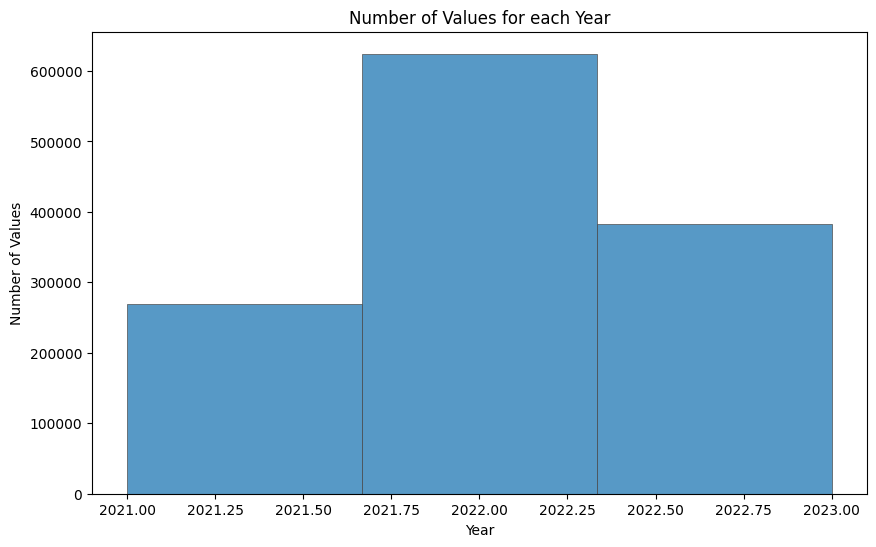

In [17]:
print("----------Gaeneral feature information----------")
print(df.Year.describe())
print()
print("----------Value information----------")
print(df.Year.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='Year', bins=df['Year'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('Year')
plt.ylabel('Number of Values')
plt.title('Number of Values for each Year')
plt.show()

In [18]:
#year_mapping = {2021: 1, 2022: 2, 2023: 3}
#data_1D_arr['Year_encoded'] = data_1D_dep['Year_encoded'] = data_1M_arr['Year_encoded'] = data_1M_dep['Year_encoded'] = df['Year'].map(year_mapping)

In [19]:
data_1D_arr['Year'] = data_1D_dep['Year'] = data_1M_arr['Year'] = data_1M_dep['Year'] = df['Year']

In [20]:
data_1M_arr.head()

,Year
0,2021
1,2021
2,2021
3,2021
4,2021


### Month

----------General feature information----------
          count  mean  std   min   25%   50%   75%   max
Month                                                   
1      101385.0   1.0  0.0   1.0   1.0   1.0   1.0   1.0
2       93135.0   2.0  0.0   2.0   2.0   2.0   2.0   2.0
3      108592.0   3.0  0.0   3.0   3.0   3.0   3.0   3.0
4      105833.0   4.0  0.0   4.0   4.0   4.0   4.0   4.0
5      111757.0   5.0  0.0   5.0   5.0   5.0   5.0   5.0
6      108628.0   6.0  0.0   6.0   6.0   6.0   6.0   6.0
7      113140.0   7.0  0.0   7.0   7.0   7.0   7.0   7.0
8      109697.0   8.0  0.0   8.0   8.0   8.0   8.0   8.0
9      105292.0   9.0  0.0   9.0   9.0   9.0   9.0   9.0
10     109589.0  10.0  0.0  10.0  10.0  10.0  10.0  10.0
11     105698.0  11.0  0.0  11.0  11.0  11.0  11.0  11.0
12     103431.0  12.0  0.0  12.0  12.0  12.0  12.0  12.0

----------Value information----------
Month
1     101385
2      93135
3     108592
4     105833
5     111757
6     108628
7     113140
8     109697
9    

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/1126642440.py:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='Month', bins=df['Month'].nunique(),


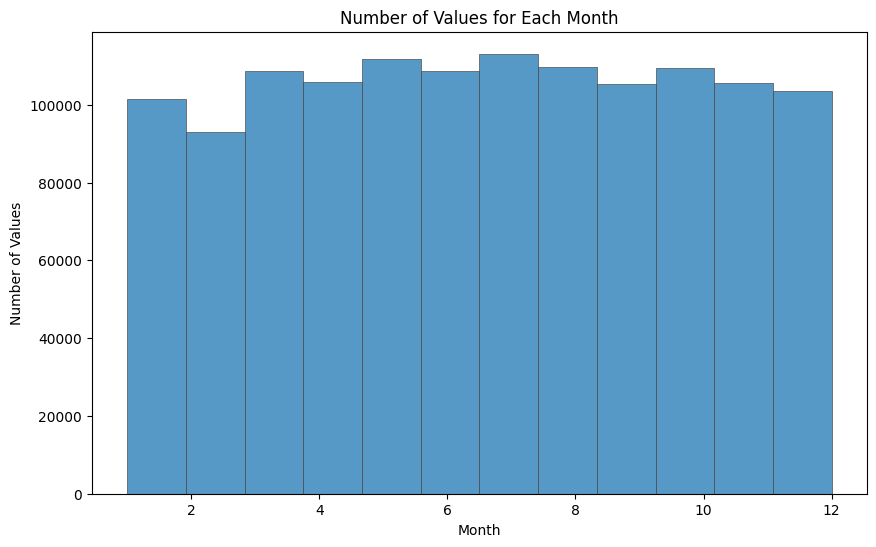

In [21]:
print("----------General feature information----------")
print(df.groupby('Month').Month.describe())
print()
print("----------Value information----------")
print(df.groupby('Month').Month.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='Month', bins=df['Month'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('Month')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each Month')
plt.show()

In [22]:
ut.encode_cyclical_feature(df, data_1D_arr, 'Month', 12)
ut.encode_cyclical_feature(df, data_1D_dep, 'Month', 12)
ut.encode_cyclical_feature(df, data_1M_arr, 'Month', 12)
ut.encode_cyclical_feature(df, data_1M_dep, 'Month', 12)

In [23]:
data_1D_arr.Month_cos.unique()

array([-5.00000000e-01, -1.83697020e-16,  5.00000000e-01,  8.66025404e-01,
        1.00000000e+00,  8.66025404e-01,  5.00000000e-01,  6.12323400e-17,
       -5.00000000e-01, -8.66025404e-01, -1.00000000e+00, -8.66025404e-01])

### DayOfMonth

----------General feature information----------
              count  mean  std   min   25%   50%   75%   max
DayOfMonth                                                  
1           41144.0   1.0  0.0   1.0   1.0   1.0   1.0   1.0
2           41721.0   2.0  0.0   2.0   2.0   2.0   2.0   2.0
3           41390.0   3.0  0.0   3.0   3.0   3.0   3.0   3.0
4           40780.0   4.0  0.0   4.0   4.0   4.0   4.0   4.0
5           41690.0   5.0  0.0   5.0   5.0   5.0   5.0   5.0
6           41560.0   6.0  0.0   6.0   6.0   6.0   6.0   6.0
7           41372.0   7.0  0.0   7.0   7.0   7.0   7.0   7.0
8           41317.0   8.0  0.0   8.0   8.0   8.0   8.0   8.0
9           42256.0   9.0  0.0   9.0   9.0   9.0   9.0   9.0
10          42554.0  10.0  0.0  10.0  10.0  10.0  10.0  10.0
11          42150.0  11.0  0.0  11.0  11.0  11.0  11.0  11.0
12          42276.0  12.0  0.0  12.0  12.0  12.0  12.0  12.0
13          42357.0  13.0  0.0  13.0  13.0  13.0  13.0  13.0
14          42532.0  14.0  0.0  14.0 

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/4240135657.py:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='DayOfMonth', bins=df['DayOfMonth'].nunique(),


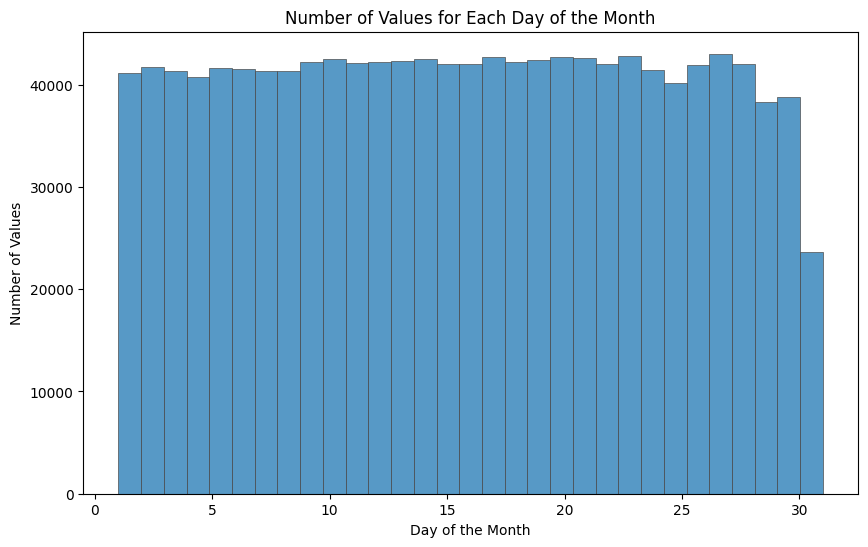

In [24]:
print("----------General feature information----------")
print(df.groupby('DayOfMonth').DayOfMonth.describe())
print()
print("----------Value information----------")
print(df.groupby('DayOfMonth').DayOfMonth.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='DayOfMonth', bins=df['DayOfMonth'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('Day of the Month')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each Day of the Month')
plt.show()

In [25]:
ut.encode_cyclical_feature(df, data_1D_arr, 'DayOfMonth', 31)
ut.encode_cyclical_feature(df, data_1D_dep, 'DayOfMonth', 31)
ut.encode_cyclical_feature(df, data_1M_arr, 'DayOfMonth', 31)
ut.encode_cyclical_feature(df, data_1M_dep, 'DayOfMonth', 31)

In [26]:
data_1D_arr.DayOfMonth_cos.unique()

array([-0.44039415,  0.82076344, -0.61210598,  0.52896401,  0.15142778,
        0.15142778,  0.34730525, -0.95413926, -0.25065253, -0.44039415,
       -0.61210598,  0.91895781,  0.97952994,  1.        , -0.87434662,
        0.68896692, -0.75875812,  0.52896401, -0.87434662, -0.75875812,
       -0.99486932, -0.99486932, -0.05064917, -0.05064917,  0.97952994,
       -0.25065253,  0.68896692])

### DayOfWeek

----------General feature information----------
              count  mean  std  min  25%  50%  75%  max
DayOfWeek                                              
1          192046.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
2          178955.0   2.0  0.0  2.0  2.0  2.0  2.0  2.0
3          179440.0   3.0  0.0  3.0  3.0  3.0  3.0  3.0
4          189598.0   4.0  0.0  4.0  4.0  4.0  4.0  4.0
5          188868.0   5.0  0.0  5.0  5.0  5.0  5.0  5.0
6          161432.0   6.0  0.0  6.0  6.0  6.0  6.0  6.0
7          185838.0   7.0  0.0  7.0  7.0  7.0  7.0  7.0

----------Value information----------
DayOfWeek
1    192046
2    178955
3    179440
4    189598
5    188868
6    161432
7    185838
Name: count, dtype: int64


/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/2663223702.py:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='DayOfWeek', bins=df['DayOfWeek'].nunique(),


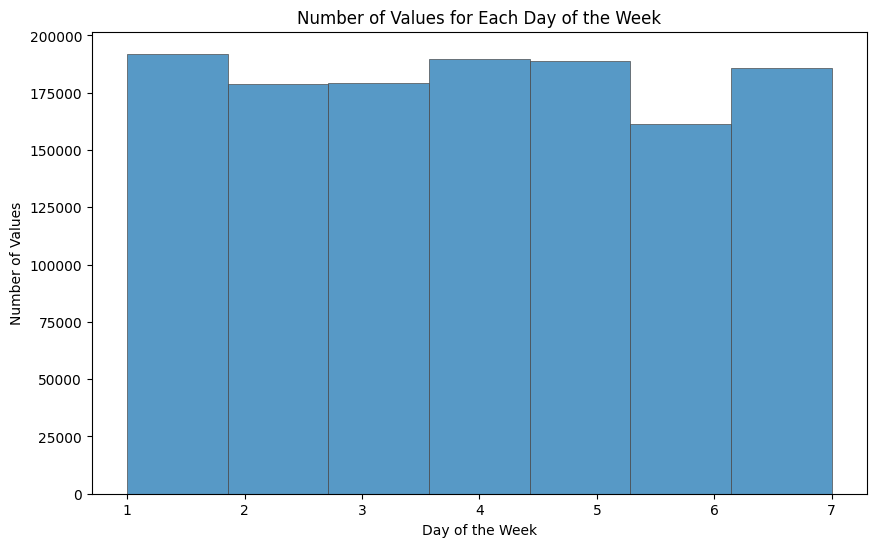

In [27]:
print("----------General feature information----------")
print(df.groupby('DayOfWeek').DayOfWeek.describe())
print()
print("----------Value information----------")
print(df.groupby('DayOfWeek').DayOfWeek.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='DayOfWeek', bins=df['DayOfWeek'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each Day of the Week')
plt.show()

In [28]:
ut.encode_cyclical_feature(df, data_1D_arr, 'DayOfWeek', 7)
ut.encode_cyclical_feature(df, data_1D_dep, 'DayOfWeek', 7)
ut.encode_cyclical_feature(df, data_1M_arr, 'DayOfWeek', 7)
ut.encode_cyclical_feature(df, data_1M_dep, 'DayOfWeek', 7)

In [29]:
data_1D_arr.head()

,Year,Month_sin,Month_cos,DayOfMonth_sin,DayOfMonth_cos,DayOfWeek_sin,DayOfWeek_cos
0,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349
1,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349
2,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349
3,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349
4,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349


### FlightDate

In [30]:
print("----------General feature information----------")
print(df.groupby('FlightDate').FlightDate.describe())
print()
print("----------Value information----------")
print(df.groupby('FlightDate').FlightDate.value_counts())

----------General feature information----------
           count                           mean                  min  \
FlightDate                                                             
2021-08-01  1862            2021-08-01 00:00:00  2021-08-01 00:00:00   
2021-08-02  1833            2021-08-02 00:00:00  2021-08-02 00:00:00   
2021-08-03  1677            2021-08-03 00:00:00  2021-08-03 00:00:00   
2021-08-04  1737            2021-08-04 00:00:00  2021-08-04 00:00:00   
2021-08-05  1837  2021-08-04 23:59:59.999999744  2021-08-05 00:00:00   
2021-08-06  1867            2021-08-06 00:00:00  2021-08-06 00:00:00   
2021-08-07  1650  2021-08-06 23:59:59.999999744  2021-08-07 00:00:00   
2021-08-08  1878            2021-08-08 00:00:00  2021-08-08 00:00:00   
2021-08-09  1867            2021-08-09 00:00:00  2021-08-09 00:00:00   
2021-08-10  1723  2021-08-09 23:59:59.999999744  2021-08-10 00:00:00   
2021-08-11  1725            2021-08-11 00:00:00  2021-08-11 00:00:00   
2021-08-12  1864

### Reporting Airline

----------General feature information----------
                    count unique top    freq
Reporting_Airline                           
9E                 116398      1  9E  116398
AA                  29989      1  AA   29989
AS                   3785      1  AS    3785
B6                  10094      1  B6   10094
DL                 832889      1  DL  832889
F9                  31493      1  F9   31493
MQ                   4014      1  MQ    4014
NK                  43958      1  NK   43958
OH                   4832      1  OH    4832
OO                  26615      1  OO   26615
UA                  21063      1  UA   21063
WN                 126745      1  WN  126745
YV                   4590      1  YV    4590
YX                  19712      1  YX   19712

----------Value information----------
Reporting_Airline
9E    116398
AA     29989
AS      3785
B6     10094
DL    832889
F9     31493
MQ      4014
NK     43958
OH      4832
OO     26615
UA     21063
WN    126745
YV      4590
YX    

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/1557667972.py:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='Reporting_Airline', bins=df['Reporting_Airline'].nunique(),


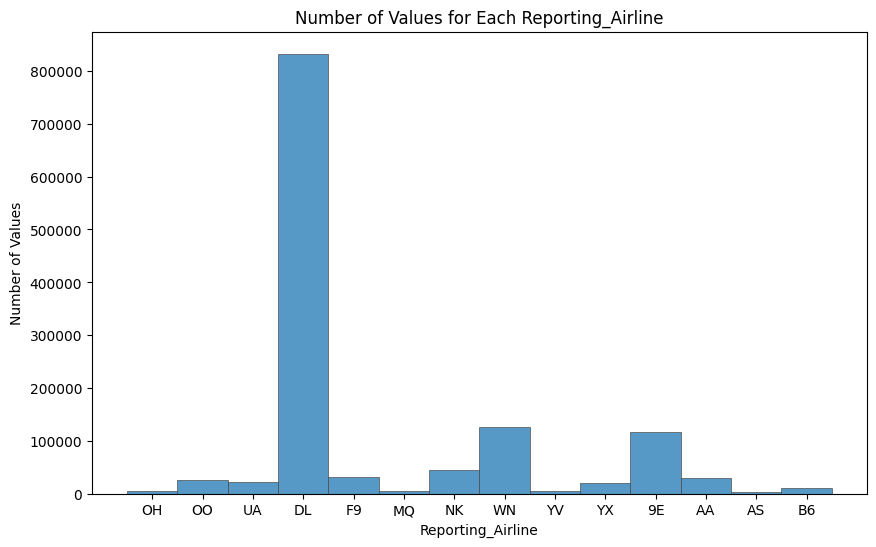

In [31]:
print("----------General feature information----------")
print(df.groupby('Reporting_Airline').Reporting_Airline.describe())
print()
print("----------Value information----------")
print(df.groupby('Reporting_Airline').Reporting_Airline.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='Reporting_Airline', bins=df['Reporting_Airline'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('Reporting_Airline')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each Reporting_Airline')
plt.show()

In [32]:
bi_DF = LabelBinarizer()
bi_dummys = bi_DF.fit_transform(df['Reporting_Airline'])
print(bi_dummys.sum(axis=0))
print(df.Reporting_Airline.value_counts())

[116398  29989   3785  10094 832889  31493   4014  43958   4832  26615
  21063 126745   4590  19712]
Reporting_Airline
DL    832889
WN    126745
9E    116398
NK     43958
F9     31493
AA     29989
OO     26615
UA     21063
YX     19712
B6     10094
OH      4832
YV      4590
MQ      4014
AS      3785
Name: count, dtype: int64


In [33]:
print(df['Reporting_Airline'].dtype)

object


In [34]:
# Assuming 'df' is your original DataFrame and 'AirlineCode' is the column to encode
df_encoded = pd.get_dummies(df[['Reporting_Airline']], prefix='Airline')

# Cast boolean columns to integers
df_encoded = df_encoded.astype(int)

# Assuming 'df_result' is another DataFrame where you want to save the encoded column
data_1D_arr = pd.concat([data_1D_arr, df_encoded], axis=1)
data_1D_dep = pd.concat([data_1D_dep, df_encoded], axis=1)
data_1M_arr = pd.concat([data_1M_arr, df_encoded], axis=1)
data_1M_dep = pd.concat([data_1M_dep, df_encoded], axis=1)

In [35]:
print(df_encoded.dtypes)

Airline_9E    int64
Airline_AA    int64
Airline_AS    int64
Airline_B6    int64
Airline_DL    int64
Airline_F9    int64
Airline_MQ    int64
Airline_NK    int64
Airline_OH    int64
Airline_OO    int64
Airline_UA    int64
Airline_WN    int64
Airline_YV    int64
Airline_YX    int64
dtype: object


In [36]:
data_1M_dep.head()

,Year,Month_sin,Month_cos,DayOfMonth_sin,DayOfMonth_cos,DayOfWeek_sin,DayOfWeek_cos,Airline_9E,Airline_AA,Airline_AS,Airline_B6,Airline_DL,Airline_F9,Airline_MQ,Airline_NK,Airline_OH,Airline_OO,Airline_UA,Airline_WN,Airline_YV,Airline_YX
0,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,0,1,0,0,0,0


### Tail Number

In [37]:
print("----------General feature information----------")
print(df.groupby('Tail_Number').Tail_Number.describe())
print()
print("----------Value information----------")
print(df.groupby('Tail_Number').Tail_Number.value_counts())

----------General feature information----------
            count unique     top  freq
Tail_Number                           
N101DQ       1444      1  N101DQ  1444
N101HQ        132      1  N101HQ   132
N102DN       1417      1  N102DN  1417
N102HQ        140      1  N102HQ   140
N102UW         72      1  N102UW    72
N103DY       1456      1  N103DY  1456
N103HQ        167      1  N103HQ   167
N103SY         23      1  N103SY    23
N103US         72      1  N103US    72
N104DN       1379      1  N104DN  1379
N104HQ        181      1  N104HQ   181
N104UW         64      1  N104UW    64
N105DX       1286      1  N105DX  1286
N105HQ        136      1  N105HQ   136
N105SY         12      1  N105SY    12
N105UW         60      1  N105UW    60
N106DN       1583      1  N106DN  1583
N106HQ        140      1  N106HQ   140
N106SY         25      1  N106SY    25
N107DN       1599      1  N107DN  1599
N107HQ        152      1  N107HQ   152
N107SY         32      1  N107SY    32
N107US         7

### Flight Number Reporting Airline

In [38]:
print("----------General feature information----------")
print(df.groupby('Flight_Number_Reporting_Airline').Flight_Number_Reporting_Airline.describe())
print()
print("----------Value information----------")
print(df.groupby('Flight_Number_Reporting_Airline').Flight_Number_Reporting_Airline.value_counts())

----------General feature information----------
                                  count    mean  std     min     25%     50%  \
Flight_Number_Reporting_Airline                                                
2                                  38.0     2.0  0.0     2.0     2.0     2.0   
5                                  40.0     5.0  0.0     5.0     5.0     5.0   
6                                  29.0     6.0  0.0     6.0     6.0     6.0   
8                                   4.0     8.0  0.0     8.0     8.0     8.0   
9                                  21.0     9.0  0.0     9.0     9.0     9.0   
12                                 28.0    12.0  0.0    12.0    12.0    12.0   
15                                 33.0    15.0  0.0    15.0    15.0    15.0   
17                                 12.0    17.0  0.0    17.0    17.0    17.0   
19                                 57.0    19.0  0.0    19.0    19.0    19.0   
20                                122.0    20.0  0.0    20.0    20.0    

### Origin Airport ID

In [39]:
print("----------General feature information----------")
print(df.groupby('OriginAirportID').OriginAirportID.describe())
print()
print("----------Value information----------")
print(df.groupby('OriginAirportID').OriginAirportID.value_counts())

----------General feature information----------
                    count     mean  std      min      25%      50%      75%  \
OriginAirportID                                                               
10135              1867.0  10135.0  0.0  10135.0  10135.0  10135.0  10135.0   
10140              2014.0  10140.0  0.0  10140.0  10140.0  10140.0  10140.0   
10146              1895.0  10146.0  0.0  10146.0  10146.0  10146.0  10146.0   
10158               128.0  10158.0  0.0  10158.0  10158.0  10158.0  10158.0   
10185              1618.0  10185.0  0.0  10185.0  10185.0  10185.0  10185.0   
10208              4222.0  10208.0  0.0  10208.0  10208.0  10208.0  10208.0   
10257              2032.0  10257.0  0.0  10257.0  10257.0  10257.0  10257.0   
10299               288.0  10299.0  0.0  10299.0  10299.0  10299.0  10299.0   
10372               282.0  10372.0  0.0  10372.0  10372.0  10372.0  10372.0   
10397            638055.0  10397.0  0.0  10397.0  10397.0  10397.0  10397.0   
1040

In [40]:
print(df.OriginAirportID.nunique())

163


In [41]:
# Calculate value counts for each OriginAirportID
airport_counts = df['OriginAirportID'].value_counts()

# Calculate cumulative percentage
cumulative_percentage = airport_counts.cumsum() / airport_counts.sum()

# Find the top OriginAirportIDs contributing to 80% of the total value counts
top_airports = cumulative_percentage[cumulative_percentage <= 0.75].index

# Display the result
print("Top OriginAirportIDs contributing to 80% of total value counts:")
print(airport_counts.loc[top_airports])

# Add the top OriginAirportIDs to the result DataFrame
data_1D_arr['OriginAirportID'] = df['OriginAirportID'].copy()
data_1D_dep['OriginAirportID'] = df['OriginAirportID'].copy()
data_1M_arr['OriginAirportID'] = df['OriginAirportID'].copy()
data_1M_dep['OriginAirportID'] = df['OriginAirportID'].copy()
data_1D_arr.loc[~data_1D_arr['OriginAirportID'].isin(top_airports), 'OriginAirportID'] = -1
data_1D_dep.loc[~data_1D_dep['OriginAirportID'].isin(top_airports), 'OriginAirportID'] = -1
data_1M_arr.loc[~data_1M_arr['OriginAirportID'].isin(top_airports), 'OriginAirportID'] = -1
data_1M_dep.loc[~data_1M_dep['OriginAirportID'].isin(top_airports), 'OriginAirportID'] = -1

data_1D_arr.head()

Top OriginAirportIDs contributing to 80% of total value counts:
OriginAirportID
10397    638055
13204     15839
12953     15131
11697     14436
13303     13350
11278     12902
15304     12169
11618     11831
13930     11658
11298     11462
11292     11257
14100     10800
10821     10768
12892     10119
11057      9990
11433      9213
10721      9152
12266      9081
12889      9005
13495      8322
12451      8173
14492      8010
10693      7749
14027      7542
10423      7377
13487      7140
12478      7111
12264      6842
14107      6628
13244      6395
14747      6391
14524      6349
11259      6326
11996      6219
Name: count, dtype: int64


,Year,Month_sin,Month_cos,DayOfMonth_sin,DayOfMonth_cos,DayOfWeek_sin,DayOfWeek_cos,Airline_9E,Airline_AA,Airline_AS,Airline_B6,Airline_DL,Airline_F9,Airline_MQ,Airline_NK,Airline_OH,Airline_OO,Airline_UA,Airline_WN,Airline_YV,Airline_YX,OriginAirportID
0,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10397
1,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10397
2,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11278
3,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11278
4,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,0,1,0,0,0,0,12266


In [42]:
data_1D_arr.OriginAirportID.nunique()

35

Remember to be cautious of ATL as Origin since it makes up half of the flights

### Origin

----------General feature information----------
count     1276177
unique        163
top           ATL
freq       638055
Name: Origin, dtype: object

----------Value information----------
Origin
ABE      1867
ABQ      2014
ABY      1895
ACY       128
AEX      1618
AGS      4222
ALB      2032
ANC       288
ASE       282
ATL    638055
ATW       792
AUS      7377
AVL      3628
BDL      4086
BGR         5
BHM      5398
BMI      1471
BNA      7749
BOI       738
BOS      9152
BQK      1734
BTR      2786
BTV       717
BUF      2278
BWI     10768
BZN       668
CAE      4286
CHA      4773
CHO      2091
CHS      5525
CID       889
CLE      6085
CLT      9990
CMH      5321
COS        56
CRW      1840
CSG      1950
CVG      4687
DAB      2715
DAL      6326
DAY      2643
DCA     12902
DEN     11257
DFW     11462
DHN      1792
DSM      2226
DTW      9213
ECP      4201
EGE       248
ELP      1379
EVV      1736
EWR     11831
EYW      3061
FAY      1648
FCA         6
FLL     14436
FSD       712
FWA     

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/2213896252.py:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='Origin', bins=df['Origin'].nunique(),


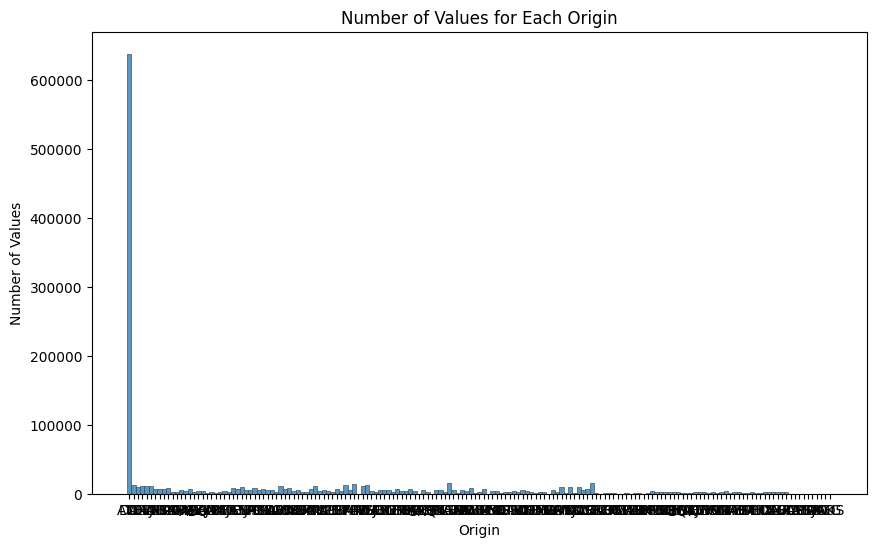

In [43]:
print("----------General feature information----------")
print(df.Origin.describe())
print()
print("----------Value information----------")
print(df.groupby('Origin').Origin.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='Origin', bins=df['Origin'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('Origin')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each Origin')
plt.show()

### Dest Airport ID

In [44]:
print("----------General feature information----------")
print(df.DestAirportID.describe())
print()
print("----------Value information----------")
print(df.DestAirportID.value_counts())

----------General feature information----------
count    1.276177e+06
mean     1.158028e+04
std      1.598972e+03
min      1.013500e+04
25%      1.039700e+04
50%      1.039700e+04
75%      1.289200e+04
max      1.591900e+04
Name: DestAirportID, dtype: float64

----------Value information----------
DestAirportID
10397    638122
13204     15766
12953     15060
11697     14462
13303     13364
11278     12909
15304     12161
11618     11786
13930     11623
11298     11444
11292     11235
14100     10784
10821     10760
12892     10122
11057      9978
11433      9225
10721      9180
12266      9083
12889      8988
13495      8289
12451      8178
14492      8041
10693      7743
14027      7552
10423      7364
13487      7156
12478      7116
12264      6855
14107      6628
11259      6412
14747      6384
13244      6381
14524      6366
11996      6225
12448      6174
14635      6168
13232      6094
11042      6083
15016      6073
12339      6068
14869      5793
14730      5736
13198      5735

In [45]:
print(df.DestAirportID.nunique())

163


In [46]:
# Calculate value counts for each OriginAirportID
airport_counts = df['DestAirportID'].value_counts()

# Calculate cumulative percentage
cumulative_percentage = airport_counts.cumsum() / airport_counts.sum()

# Find the top OriginAirportIDs contributing to 80% of the total value counts
top_airports = cumulative_percentage[cumulative_percentage <= 0.75].index

# Display the result
print("Top DestAirportIDs contributing to 80% of total value counts:")
print(airport_counts.loc[top_airports])

# Add the top OriginAirportIDs to the result DataFrame
data_1D_arr['DestAirportID'] = df['DestAirportID'].copy()
data_1D_dep['DestAirportID'] = df['DestAirportID'].copy()
data_1M_arr['DestAirportID'] = df['DestAirportID'].copy()
data_1M_dep['DestAirportID'] = df['DestAirportID'].copy()
data_1D_arr.loc[~data_1D_arr['DestAirportID'].isin(top_airports), 'DestAirportID'] = -1
data_1D_dep.loc[~data_1D_dep['DestAirportID'].isin(top_airports), 'DestAirportID'] = -1
data_1M_arr.loc[~data_1M_arr['DestAirportID'].isin(top_airports), 'DestAirportID'] = -1
data_1M_dep.loc[~data_1M_dep['DestAirportID'].isin(top_airports), 'DestAirportID'] = -1

data_1D_arr.head()

Top DestAirportIDs contributing to 80% of total value counts:
DestAirportID
10397    638122
13204     15766
12953     15060
11697     14462
13303     13364
11278     12909
15304     12161
11618     11786
13930     11623
11298     11444
11292     11235
14100     10784
10821     10760
12892     10122
11057      9978
11433      9225
10721      9180
12266      9083
12889      8988
13495      8289
12451      8178
14492      8041
10693      7743
14027      7552
10423      7364
13487      7156
12478      7116
12264      6855
14107      6628
11259      6412
14747      6384
13244      6381
14524      6366
11996      6225
Name: count, dtype: int64


,Year,Month_sin,Month_cos,DayOfMonth_sin,DayOfMonth_cos,DayOfWeek_sin,DayOfWeek_cos,Airline_9E,Airline_AA,Airline_AS,Airline_B6,Airline_DL,Airline_F9,Airline_MQ,Airline_NK,Airline_OH,Airline_OO,Airline_UA,Airline_WN,Airline_YV,Airline_YX,OriginAirportID,DestAirportID
0,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10397,11278
1,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10397,11278
2,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11278,10397
3,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11278,10397
4,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,0,1,0,0,0,0,12266,10397


In [47]:
data_1D_arr.DestAirportID.nunique()

35

### Dest

----------General feature information----------
count     1276177
unique        163
top           ATL
freq       638122
Name: Dest, dtype: object

----------Value information----------
Dest
ATL    638122
MCO     15766
LGA     15060
FLL     14462
MIA     13364
DCA     12909
TPA     12161
EWR     11786
ORD     11623
DFW     11444
DEN     11235
PHL     10784
BWI     10760
LAX     10122
CLT      9978
DTW      9225
BOS      9180
IAH      9083
LAS      8988
MSY      8289
JAX      8178
RDU      8041
BNA      7743
PBI      7552
AUS      7364
MSP      7156
JFK      7116
IAD      6855
PHX      6628
DAL      6412
SEA      6384
MEM      6381
RIC      6366
GSP      6225
JAN      6174
RSW      6168
MDW      6094
CLE      6083
STL      6073
IND      6068
SLC      5793
SDF      5736
MCI      5735
HOU      5580
SAT      5573
CHS      5526
BHM      5399
CMH      5368
SRQ      5219
SAV      5209
TYS      5184
SFO      5084
PNS      4908
PIT      4841
CHA      4772
CVG      4691
LIT      4618
ORF      457

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/1870103024.py:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='Dest', bins=df['Dest'].nunique(),


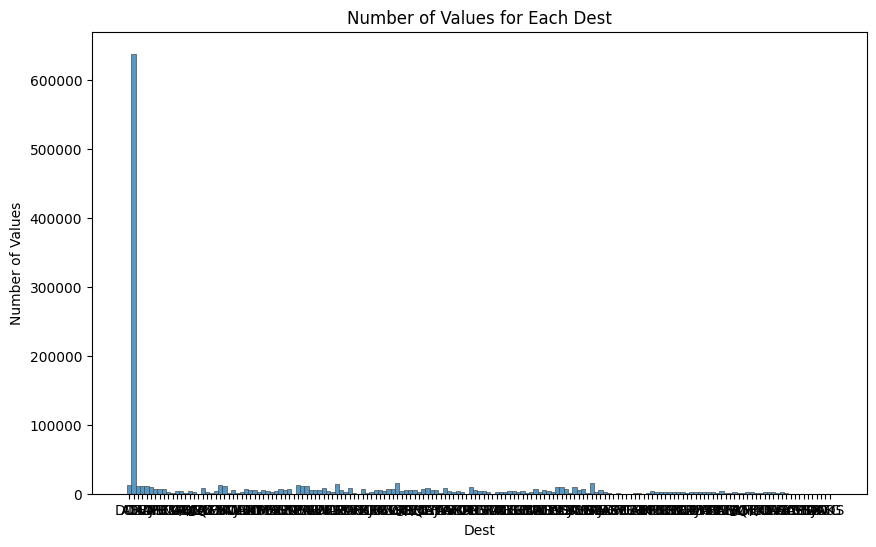

In [48]:
print("----------General feature information----------")
print(df.Dest.describe())
print()
print("----------Value information----------")
print(df.Dest.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='Dest', bins=df['Dest'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('Dest')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each Dest')
plt.show()

### CRSDepTime

----------General feature information----------
count    1.276177e+06
mean     1.343121e+03
std      5.072556e+02
min      1.000000e+00
25%      9.140000e+02
50%      1.325000e+03
75%      1.747000e+03
max      2.359000e+03
Name: CRSDepTime, dtype: float64

----------Value information----------
CRSDepTime
600     44347
700     23869
810     11489
715     11220
1100    10193
800      9705
1000     8835
815      7905
900      7447
820      7440
1215     7364
530      7181
830      7096
615      6825
1400     6697
855      6477
705      6364
1510     6299
1959     6158
630      6050
1010     5969
1920     5946
1200     5765
2045     5742
1740     5730
1340     5726
940      5555
1015     5483
1005     5368
720      5277
1700     5229
1930     5180
1515     5152
730      5074
1500     4948
955      4844
1620     4815
605      4746
1745     4723
1300     4635
1600     4563
2235     4532
1755     4511
825      4501
1105     4464
1955     4352
1115     4292
2225     4272
1220     4251
1110   

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/238208227.py:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='CRSDepTime', bins=df['CRSDepTime'].nunique(),


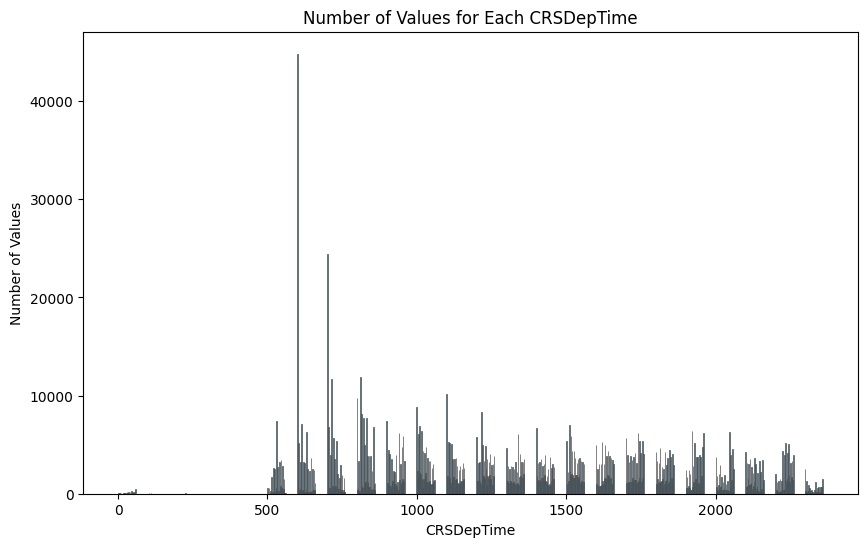

In [49]:
print("----------General feature information----------")
print(df.CRSDepTime.describe())
print()
print("----------Value information----------")
print(df.CRSDepTime.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='CRSDepTime', bins=df['CRSDepTime'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('CRSDepTime')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each CRSDepTime')
plt.show()

In [50]:
ut.encode_cyclical_feature(df, data_1D_arr, 'CRSDepTime', 2400)
ut.encode_cyclical_feature(df, data_1D_dep, 'CRSDepTime', 2400)
ut.encode_cyclical_feature(df, data_1M_arr, 'CRSDepTime', 2400)
ut.encode_cyclical_feature(df, data_1M_dep, 'CRSDepTime', 2400)

In [51]:
data_1D_arr.head()

,Year,Month_sin,Month_cos,DayOfMonth_sin,DayOfMonth_cos,DayOfWeek_sin,DayOfWeek_cos,Airline_9E,Airline_AA,Airline_AS,Airline_B6,Airline_DL,Airline_F9,Airline_MQ,Airline_NK,Airline_OH,Airline_OO,Airline_UA,Airline_WN,Airline_YV,Airline_YX,OriginAirportID,DestAirportID,CRSDepTime_sin,CRSDepTime_cos
0,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10397,11278,-0.902585,-0.430511
1,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10397,11278,-0.902585,-0.430511
2,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11278,10397,-0.382683,-0.923880
3,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11278,10397,-0.382683,-0.923880
4,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,0,1,0,0,0,0,12266,10397,0.608761,-0.793353


### DepTime

In [52]:
print("----------General feature information----------")
print(df.DepTime.describe())
print()
print("----------Value information----------")
print(df.DepTime.value_counts())

----------General feature information----------
count    1.276177e+06
mean     1.343225e+03
std      5.213320e+02
min      1.000000e+00
25%      9.140000e+02
50%      1.328000e+03
75%      1.753000e+03
max      2.400000e+03
Name: DepTime, dtype: float64

----------Value information----------
DepTime
557.0     5204
555.0     5065
558.0     4938
556.0     4668
559.0     4584
600.0     3944
554.0     3508
657.0     3362
658.0     3302
659.0     3068
655.0     3026
656.0     2862
700.0     2735
553.0     2710
957.0     2268
958.0     2257
1000.0    2219
654.0     2190
810.0     2165
959.0     2159
955.0     2146
956.0     2112
1100.0    2056
808.0     2054
1057.0    2039
809.0     2022
713.0     2015
552.0     2007
601.0     1975
1058.0    1971
807.0     1963
1355.0    1954
714.0     1950
1059.0    1942
1005.0    1932
1010.0    1931
1056.0    1919
1055.0    1916
1006.0    1908
954.0     1900
815.0     1897
715.0     1878
1105.0    1872
712.0     1871
710.0     1856
1007.0    1849
1009.0   

### DepDelay

----------General feature information----------
count    1.276177e+06
mean     1.070045e+01
std      4.693250e+01
min     -9.000000e+01
25%     -4.000000e+00
50%     -1.000000e+00
75%      7.000000e+00
max      3.221000e+03
Name: DepDelay, dtype: float64

----------Value information----------
DepDelay
-3.0       119979
-2.0       111577
-4.0       106001
-5.0       105040
-1.0       100444
 0.0        81258
-6.0        59483
-7.0        42574
 1.0        33590
-8.0        30544
 2.0        25739
 3.0        22939
 4.0        20858
 5.0        18633
 6.0        16831
-9.0        15997
 7.0        15392
 8.0        14457
-10.0       13160
 9.0        12856
 10.0       12343
 11.0       11017
 12.0       10429
 13.0        9617
 14.0        9245
 15.0        8682
 16.0        8008
 17.0        7499
 18.0        7204
 19.0        6743
 20.0        6608
-11.0        6150
 21.0        6139
 22.0        5819
 23.0        5671
 24.0        5397
 25.0        5056
 26.0        4846
 27.0        

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/3318644839.py:10: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='DepDelay', bins=df['DepDelay'].nunique(),


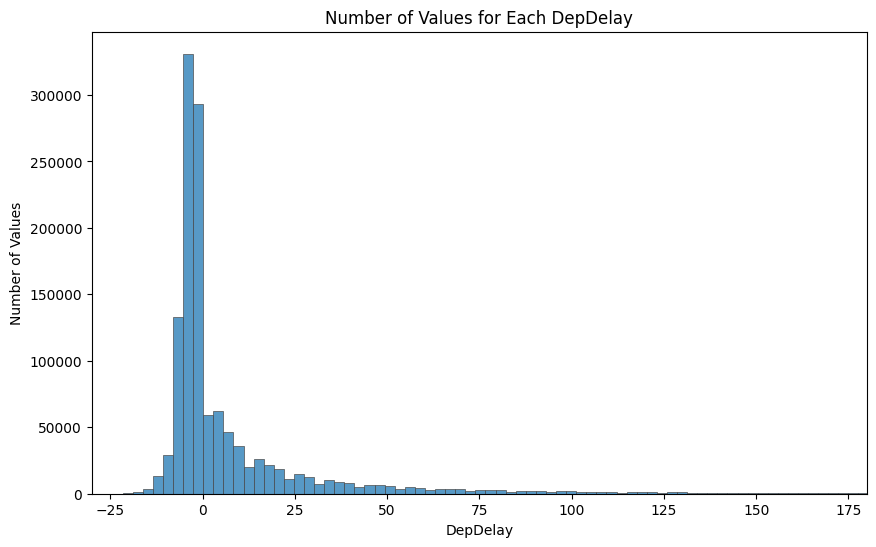

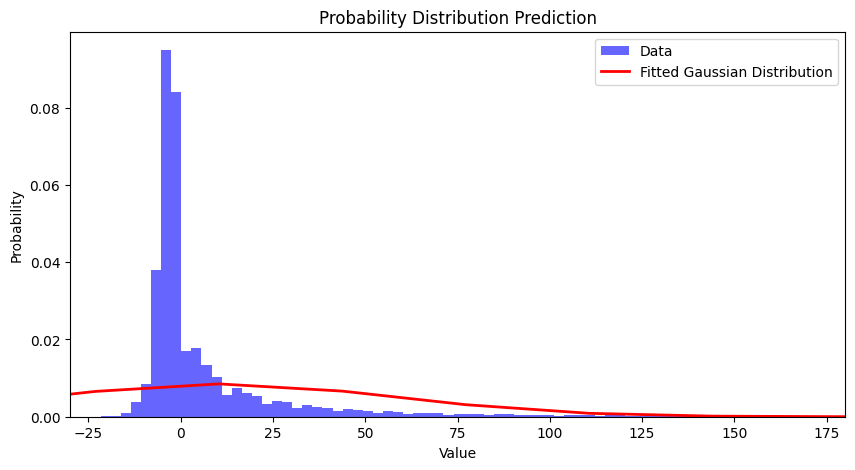

In [53]:
print("----------General feature information----------")
print(df.DepDelay.describe())
print()
print("----------Value information----------")
print(df.DepDelay.value_counts())
print("----------Sorted value information----------")
print(df.groupby('DepDelay').DepDelay.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='DepDelay', bins=df['DepDelay'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('DepDelay')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each DepDelay')
plt.xlim(left=-30, right=180)
plt.show()

data = df.DepDelay
# Fit a probability distribution (Gaussian distribution) to the data
mu, std = norm.fit(data)

# Create a range of values for the x-axis
x = np.linspace(data.min(), data.max(), 100)

# Calculate the probability density function (PDF) for the fitted Gaussian distribution
pdf = norm.pdf(x, mu, std)

# Plot the data and the fitted distribution
plt.figure(figsize=(10, 5))
plt.hist(data, bins=df['DepDelay'].nunique(), density=True, alpha=0.6, color='b', label='Data')
plt.plot(x, pdf, 'r-', lw=2, label='Fitted Gaussian Distribution')
plt.title('Probability Distribution Prediction')
plt.xlabel('Value')
plt.ylabel('Probability')
plt.xlim(left=-30, right=180)
plt.legend()
plt.show()

In [54]:
min_value = df['DepDelay'].min()
max_value = df['DepDelay'].max()

# Display the result
print(f"The minimum value in the 'DepDelay' column is: {min_value}")
print(f"The minimum value in the 'DepDelay' column is: {max_value}")

The minimum value in the 'DepDelay' column is: -90.0
The minimum value in the 'DepDelay' column is: 3221.0


According to the defintion, a delay above 180 minutes is considered as cancellation. Also delays below -15 minutes are not considered due to reduce noise and remove outliers.

In [55]:
df_filtered = df[(df['DepDelay'] >= -30.0) & (df['DepDelay'] <= 180.0)]
data_1D_dep = data_1D_dep.merge(df_filtered[['DepDelay']], left_index=True, right_index=True, how='inner')
data_1M_dep = data_1M_dep.merge(df_filtered[['DepDelay']], left_index=True, right_index=True, how='inner')
# Exclude values outside the specified range
#data_1D_dep = pd.concat([data_1D_dep, df[(df['DepDelay'] >= -15.0) & (df['DepDelay'] <= 180.0)]['DepDelay']], axis=1)
#data_1M_dep = pd.concat([data_1M_dep, df[(df['DepDelay'] >= -15.0) & (df['DepDelay'] <= 180.0)]['DepDelay']], axis=1)

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/2582641730.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data_1D_dep, x='DepDelay', bins=data_1D_dep['DepDelay'].nunique(),


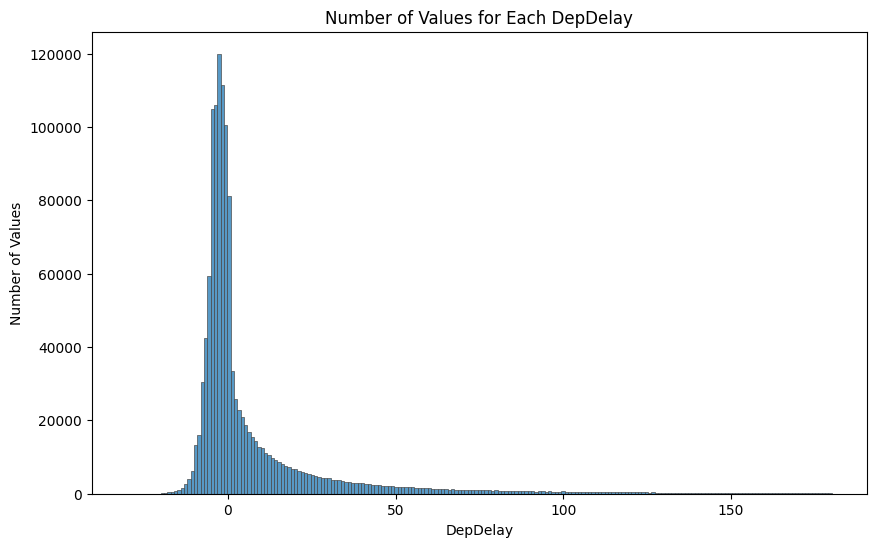

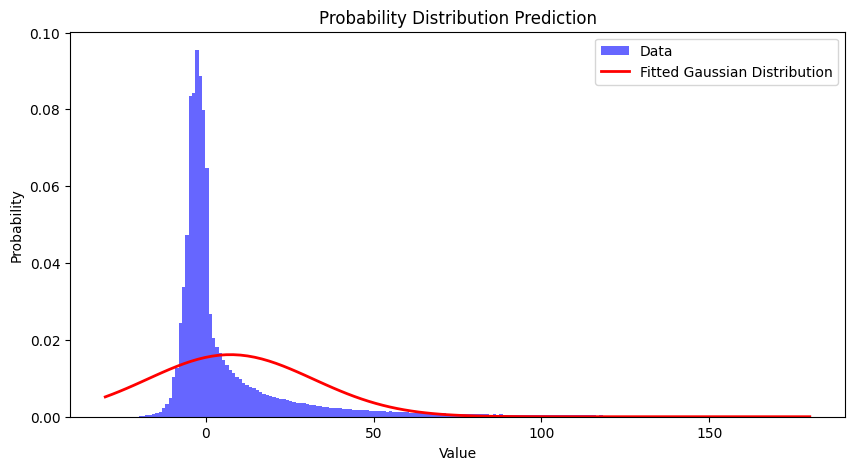

In [56]:
plt.figure(figsize=(10, 6))
sns.histplot(data=data_1D_dep, x='DepDelay', bins=data_1D_dep['DepDelay'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('DepDelay')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each DepDelay')
plt.show()

data = data_1D_dep.DepDelay

# Fit a probability distribution (Gaussian distribution) to the data
mu, std = norm.fit(data)

# Create a range of values for the x-axis
x = np.linspace(data.min(), data.max(), 100)

# Calculate the probability density function (PDF) for the fitted Gaussian distribution
pdf = norm.pdf(x, mu, std)

# Plot the data and the fitted distribution
plt.figure(figsize=(10, 5))
plt.hist(data, bins=data_1D_dep['DepDelay'].nunique(), density=True, alpha=0.6, color='b', label='Data')
plt.plot(x, pdf, 'r-', lw=2, label='Fitted Gaussian Distribution')
plt.title('Probability Distribution Prediction')
plt.xlabel('Value')
plt.ylabel('Probability')
plt.legend()
plt.show()

Maybe use Log Transformation to decrease the right-skewness.

In [57]:
data_1D_dep.head()

,Year,Month_sin,Month_cos,DayOfMonth_sin,DayOfMonth_cos,DayOfWeek_sin,DayOfWeek_cos,Airline_9E,Airline_AA,Airline_AS,Airline_B6,Airline_DL,Airline_F9,Airline_MQ,Airline_NK,Airline_OH,Airline_OO,Airline_UA,Airline_WN,Airline_YV,Airline_YX,OriginAirportID,DestAirportID,CRSDepTime_sin,CRSDepTime_cos,DepDelay
0,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10397,11278,-0.902585,-0.430511,-2.0
1,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10397,11278,-0.902585,-0.430511,-6.0
2,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11278,10397,-0.382683,-0.923880,-2.0
3,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11278,10397,-0.382683,-0.923880,-6.0
4,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,0,1,0,0,0,0,12266,10397,0.608761,-0.793353,-3.0


In [58]:
data_1D_dep.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1263181 entries, 0 to 1276176
Data columns (total 26 columns):
 #   Column           Non-Null Count    Dtype  
---  ------           --------------    -----  
 0   Year             1263181 non-null  int64  
 1   Month_sin        1263181 non-null  float64
 2   Month_cos        1263181 non-null  float64
 3   DayOfMonth_sin   1263181 non-null  float64
 4   DayOfMonth_cos   1263181 non-null  float64
 5   DayOfWeek_sin    1263181 non-null  float64
 6   DayOfWeek_cos    1263181 non-null  float64
 7   Airline_9E       1263181 non-null  int64  
 8   Airline_AA       1263181 non-null  int64  
 9   Airline_AS       1263181 non-null  int64  
 10  Airline_B6       1263181 non-null  int64  
 11  Airline_DL       1263181 non-null  int64  
 12  Airline_F9       1263181 non-null  int64  
 13  Airline_MQ       1263181 non-null  int64  
 14  Airline_NK       1263181 non-null  int64  
 15  Airline_OH       1263181 non-null  int64  
 16  Airline_OO       126318

### DepDel15

In [59]:
print("----------General feature information----------")
print(df.DepDel15.describe())
print()
print("----------Value information----------")
print(df.DepDel15.value_counts())

----------General feature information----------
count    1.276177e+06
mean     1.866332e-01
std      3.896170e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+00
Name: DepDel15, dtype: float64

----------Value information----------
DepDel15
0.0    1038000
1.0     238177
Name: count, dtype: int64


### DepartureDelayGroups

----------General feature information----------
count    1.276177e+06
mean     4.812734e-02
std      2.091794e+00
min     -2.000000e+00
25%     -1.000000e+00
50%     -1.000000e+00
75%      0.000000e+00
max      1.200000e+01
Name: DepartureDelayGroups, dtype: float64

----------Value information----------
DepartureDelayGroups
-2.0       2152
-1.0     720644
 0.0     315204
 1.0      91020
 2.0      46725
 3.0      27807
 4.0      17656
 5.0      12307
 6.0       8819
 7.0       6620
 8.0       4985
 9.0       3777
 10.0      3016
 11.0      2310
 12.0     13135
Name: count, dtype: int64


/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/2810355433.py:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='DepartureDelayGroups', bins=14,


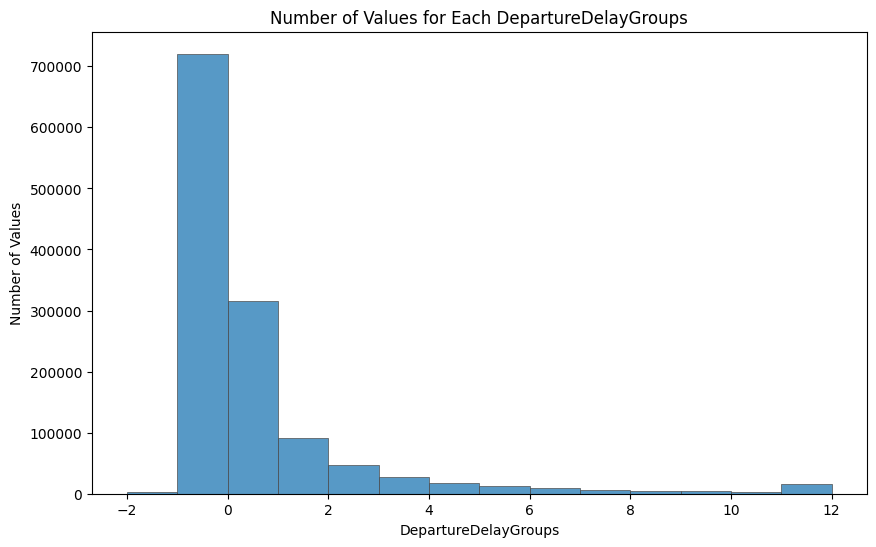

In [60]:
print("----------General feature information----------")
print(df.DepartureDelayGroups.describe())
print()
print("----------Value information----------")
print(df.groupby('DepartureDelayGroups').DepartureDelayGroups.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='DepartureDelayGroups', bins=14,
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('DepartureDelayGroups')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each DepartureDelayGroups')
plt.show()

Probably doesnt make sense to include into Arrival delays

In [61]:
#data_1D_arr['DepartureDelayGroups'] = data_1D_dep['DepartureDelayGroups'] = data_1M_arr['DepartureDelayGroups'] = data_1M_dep['DepartureDelayGroups'] = df['DepartureDelayGroups']
#data_1D_arr.info()

### DepTimeBlk

----------General feature information----------
count       1276177
unique           19
top       0600-0659
freq          93478
Name: DepTimeBlk, dtype: object

----------Value information----------
DepTimeBlk
0001-0559    37442
0600-0659    93478
0700-0759    80151
0800-0859    87709
0900-0959    68917
1000-1059    84974
1100-1159    77302
1200-1259    81759
1300-1359    66319
1400-1459    66536
1500-1559    80637
1600-1659    71352
1700-1759    79732
1800-1859    68236
1900-1959    66399
2000-2059    46112
2100-2159    50767
2200-2259    54104
2300-2359    14251
Name: count, dtype: int64


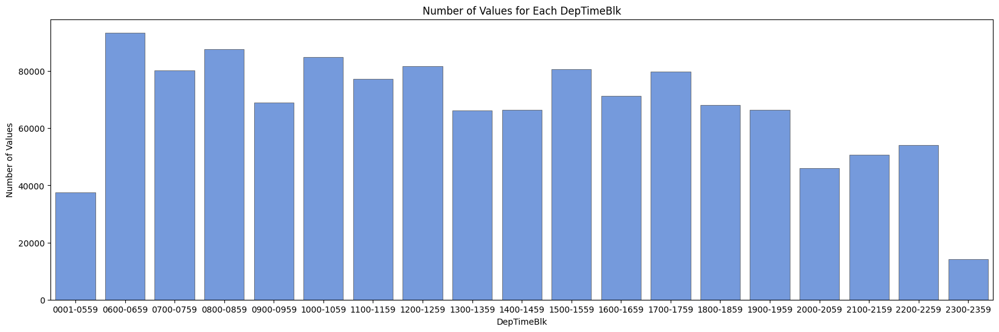

In [62]:
print("----------General feature information----------")
print(df.DepTimeBlk.describe())
print()
print("----------Value information----------")
print(df.groupby('DepTimeBlk').DepTimeBlk.value_counts())

# Sort the time blocks for plotting
sorted_time_blocks = df.groupby('DepTimeBlk').indices

plt.figure(figsize=(20, 6))
sns.countplot(data=df, x='DepTimeBlk', color="cornflowerblue", edgecolor=".3", linewidth=.5, order=sorted_time_blocks)
plt.xlabel('DepTimeBlk')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each DepTimeBlk')
plt.show()

In [63]:
# Perform one-hot encoding
# dep_time_blocks_encoded = pd.get_dummies(df['DepTimeBlk'], prefix='DepTimeBlk')

dep_time_block_mapping = {
    '0001-0559': 0,
    '0600-0659': 1,
    '0700-0759': 2,
    '0800-0859': 3,
    '0900-0959': 4,
    '1000-1059': 5,
    '1100-1159': 6,
    '1200-1259': 7,
    '1300-1359': 8,
    '1400-1459': 9,
    '1500-1559': 10,
    '1600-1659': 11,
    '1700-1759': 12,
    '1800-1859': 13,
    '1900-1959': 14,
    '2000-2059': 15,
    '2100-2159': 16,
    '2200-2259': 17,
    '2300-2359': 18
}

dep_time_blocks_encoded = df['DepTimeBlk'].map(dep_time_block_mapping)

# Concatenate the encoded columns to the original DataFrame
data_1D_arr = pd.concat([data_1D_arr, dep_time_blocks_encoded.rename('DepTimeBlkEncoded')], axis=1)
data_1D_dep = pd.concat([data_1D_dep, dep_time_blocks_encoded.rename('DepTimeBlkEncoded')], axis=1)
data_1M_arr = pd.concat([data_1M_arr, dep_time_blocks_encoded.rename('DepTimeBlkEncoded')], axis=1)
data_1M_dep = pd.concat([data_1M_dep, dep_time_blocks_encoded.rename('DepTimeBlkEncoded')], axis=1)

In [64]:
data_1D_arr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1276177 entries, 0 to 1276176
Data columns (total 26 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   Year               1276177 non-null  int64  
 1   Month_sin          1276177 non-null  float64
 2   Month_cos          1276177 non-null  float64
 3   DayOfMonth_sin     1276177 non-null  float64
 4   DayOfMonth_cos     1276177 non-null  float64
 5   DayOfWeek_sin      1276177 non-null  float64
 6   DayOfWeek_cos      1276177 non-null  float64
 7   Airline_9E         1276177 non-null  int64  
 8   Airline_AA         1276177 non-null  int64  
 9   Airline_AS         1276177 non-null  int64  
 10  Airline_B6         1276177 non-null  int64  
 11  Airline_DL         1276177 non-null  int64  
 12  Airline_F9         1276177 non-null  int64  
 13  Airline_MQ         1276177 non-null  int64  
 14  Airline_NK         1276177 non-null  int64  
 15  Airline_OH         1276177 non-n

### TaxiOut

In [65]:
print("----------General feature information----------")
print(df.TaxiOut.describe())
print()
print("----------Value information----------")
print(df.groupby('TaxiOut').TaxiOut.value_counts())

----------General feature information----------
count    1.276177e+06
mean     1.565277e+01
std      7.564673e+00
min      1.000000e+00
25%      1.100000e+01
50%      1.400000e+01
75%      1.800000e+01
max      1.770000e+02
Name: TaxiOut, dtype: float64

----------Value information----------
TaxiOut
1.0          22
2.0          33
3.0          58
4.0         113
5.0         463
6.0        2009
7.0        9539
8.0       31209
9.0       66582
10.0     101520
11.0     123447
12.0     131082
13.0     125902
14.0     113805
15.0      98474
16.0      82153
17.0      66989
18.0      54536
19.0      43972
20.0      35562
21.0      28904
22.0      23277
23.0      19510
24.0      15951
25.0      13350
26.0      11279
27.0       9433
28.0       8084
29.0       6698
30.0       5729
31.0       4995
32.0       4383
33.0       3768
34.0       3250
35.0       2960
36.0       2471
37.0       2173
38.0       1914
39.0       1683
40.0       1567
41.0       1376
42.0       1244
43.0       1157
44.0       

### WheelsOff

In [66]:
print("----------General feature information----------")
print(df.WheelsOff.describe())
print()
print("----------Value information----------")
print(df.groupby('WheelsOff').WheelsOff.value_counts())

----------General feature information----------
count    1.276177e+06
mean     1.362222e+03
std      5.239046e+02
min      1.000000e+00
25%      9.270000e+02
50%      1.338000e+03
75%      1.806000e+03
max      2.400000e+03
Name: WheelsOff, dtype: float64

----------Value information----------
WheelsOff
1.0        263
2.0        268
3.0        288
4.0        287
5.0        281
6.0        276
7.0        307
8.0        296
9.0        267
10.0       268
11.0       260
12.0       263
13.0       218
14.0       228
15.0       225
16.0       195
17.0       191
18.0       182
19.0       167
20.0       192
21.0       185
22.0       173
23.0       166
24.0       159
25.0       159
26.0       140
27.0       146
28.0       144
29.0       175
30.0       137
31.0       127
32.0        97
33.0       123
34.0       117
35.0       132
36.0       119
37.0       115
38.0       119
39.0       115
40.0       115
41.0       120
42.0       115
43.0       113
44.0       110
45.0       110
46.0       107
47.0 

### WheelsOn

In [67]:
print("----------General feature information----------")
print(df.WheelsOn.describe())
print()
print("----------Value information----------")
print(df.groupby('WheelsOn').WheelsOn.value_counts())

----------General feature information----------
count    1.276177e+06
mean     1.440923e+03
std      5.442916e+02
min      1.000000e+00
25%      1.023000e+03
50%      1.439000e+03
75%      1.910000e+03
max      2.400000e+03
Name: WheelsOn, dtype: float64

----------Value information----------
WheelsOn
1.0        749
2.0        769
3.0        713
4.0        720
5.0        686
6.0        696
7.0        708
8.0        695
9.0        698
10.0       670
11.0       696
12.0       620
13.0       660
14.0       615
15.0       652
16.0       625
17.0       642
18.0       599
19.0       608
20.0       599
21.0       568
22.0       548
23.0       544
24.0       532
25.0       494
26.0       537
27.0       499
28.0       555
29.0       476
30.0       483
31.0       540
32.0       450
33.0       415
34.0       450
35.0       488
36.0       467
37.0       441
38.0       434
39.0       395
40.0       452
41.0       398
42.0       397
43.0       382
44.0       371
45.0       345
46.0       349
47.0   

### TaxiIn

In [68]:
print("----------General feature information----------")
print(df.TaxiIn.describe())
print()
print("----------Value information----------")
print(df.groupby('TaxiIn').TaxiIn.value_counts())

----------General feature information----------
count    1.276177e+06
mean     7.519022e+00
std      5.536742e+00
min      1.000000e+00
25%      5.000000e+00
50%      6.000000e+00
75%      9.000000e+00
max      2.070000e+02
Name: TaxiIn, dtype: float64

----------Value information----------
TaxiIn
1.0         688
2.0       21531
3.0       97976
4.0      177819
5.0      199281
6.0      179869
7.0      145327
8.0      114519
9.0       85961
10.0      62723
11.0      43861
12.0      31290
13.0      22647
14.0      16793
15.0      12590
16.0       9580
17.0       7706
18.0       5899
19.0       4909
20.0       4027
21.0       3425
22.0       2923
23.0       2522
24.0       2171
25.0       1935
26.0       1734
27.0       1505
28.0       1386
29.0       1137
30.0       1026
31.0        937
32.0        864
33.0        732
34.0        683
35.0        653
36.0        545
37.0        545
38.0        469
39.0        409
40.0        408
41.0        368
42.0        337
43.0        300
44.0        2

### CRSArrTime

----------General feature information----------
count    1.276177e+06
mean     1.467917e+03
std      5.318805e+02
min      1.000000e+00
25%      1.040000e+03
50%      1.454000e+03
75%      1.920000e+03
max      2.359000e+03
Name: CRSArrTime, dtype: float64

----------Value information----------
CRSArrTime
905     8225
2010    8162
2359    7273
1845    6514
735     4344
1435    3968
2150    3877
1545    3816
2200    3800
1305    3607
900     3567
820     3519
1705    3489
950     3450
1140    3204
1000    3062
1015    3020
2120    2940
2009    2898
2100    2856
2050    2836
1840    2774
2055    2765
850     2757
2355    2751
2110    2732
1025    2708
904     2706
1400    2691
955     2668
1230    2633
2005    2611
1105    2572
844     2559
1844    2551
930     2534
1010    2510
2358    2504
1020    2481
730     2475
1155    2470
810     2470
1849    2467
1940    2465
1100    2458
2015    2436
1350    2421
2140    2420
920     2399
2115    2397
2357    2397
755     2393
1225    2381
2004

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/2430687195.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='CRSArrTime', bins=df['CRSArrTime'].nunique(),


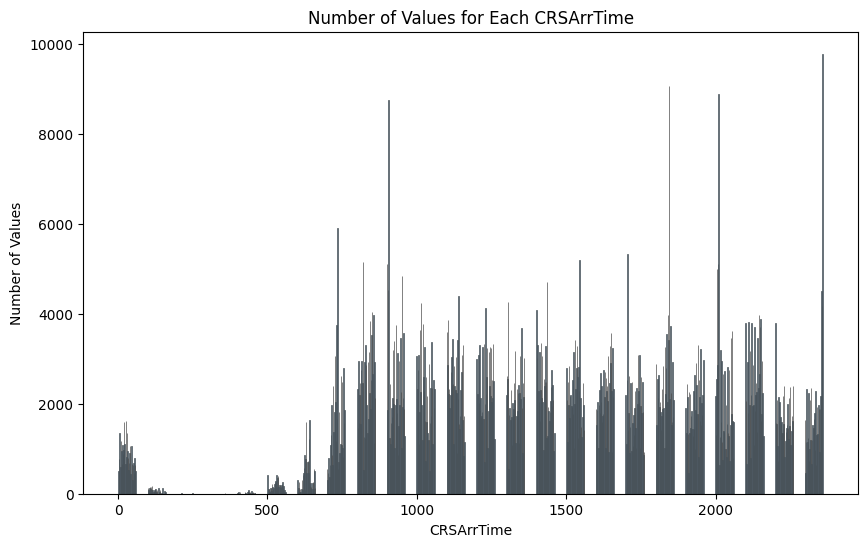

In [69]:
print("----------General feature information----------")
print(df.CRSArrTime.describe())
print()
print("----------Value information----------")
print(df.CRSArrTime.value_counts())
print()
print("----------Sorted value information----------")
print(df.groupby('CRSArrTime').CRSArrTime.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='CRSArrTime', bins=df['CRSArrTime'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('CRSArrTime')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each CRSArrTime')
plt.show()

In [70]:
ut.encode_cyclical_feature(df, data_1D_arr, 'CRSArrTime', 2400)
ut.encode_cyclical_feature(df, data_1D_dep, 'CRSArrTime', 2400)
ut.encode_cyclical_feature(df, data_1M_arr, 'CRSArrTime', 2400)
ut.encode_cyclical_feature(df, data_1M_dep, 'CRSArrTime', 2400)

In [71]:
data_1D_arr.head()

,Year,Month_sin,Month_cos,DayOfMonth_sin,DayOfMonth_cos,DayOfWeek_sin,DayOfWeek_cos,Airline_9E,Airline_AA,Airline_AS,Airline_B6,Airline_DL,Airline_F9,Airline_MQ,Airline_NK,Airline_OH,Airline_OO,Airline_UA,Airline_WN,Airline_YV,Airline_YX,OriginAirportID,DestAirportID,CRSDepTime_sin,CRSDepTime_cos,DepTimeBlkEncoded,CRSArrTime_sin,CRSArrTime_cos
0,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10397,11278,-0.902585,-0.430511,11,-0.996917,0.078459
1,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10397,11278,-0.902585,-0.430511,11,-0.996917,0.078459
2,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11278,10397,-0.382683,-0.923880,8,-0.788548,-0.614974
3,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11278,10397,-0.382683,-0.923880,8,-0.788548,-0.614974
4,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,0,1,0,0,0,0,12266,10397,0.608761,-0.793353,4,-0.146083,-0.989272


### ArrDelay

----------General feature information----------
count    1.276177e+06
mean     4.343157e+00
std      4.865641e+01
min     -9.000000e+01
25%     -1.400000e+01
50%     -6.000000e+00
75%      6.000000e+00
max      3.237000e+03
Name: ArrDelay, dtype: float64

----------Value information----------
ArrDelay
-10.0      43751
-11.0      43594
-12.0      43425
-9.0       43307
-8.0       41817
-13.0      41685
-14.0      40181
-7.0       40160
-6.0       38397
-15.0      37802
-5.0       36213
-16.0      35093
-4.0       33757
-17.0      31813
-3.0       31467
-2.0       29046
-18.0      28891
-1.0       26948
-19.0      25562
 0.0       25126
-20.0      22419
 1.0       22250
 2.0       20485
-21.0      19416
 3.0       19061
 4.0       17550
-22.0      16812
 5.0       16015
 6.0       14679
-23.0      14201
 7.0       13707
 8.0       12657
 9.0       11814
-24.0      11668
 10.0      11080
 11.0      10393
-25.0       9789
 12.0       9622
 13.0       8965
 14.0       8579
-26.0       8215


/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/3557946377.py:10: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='ArrDelay', bins=df['ArrDelay'].nunique(),


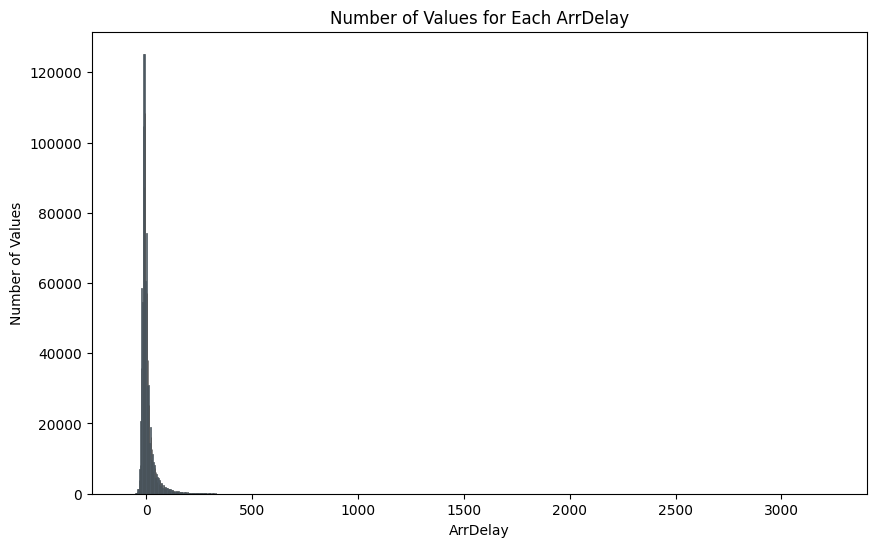

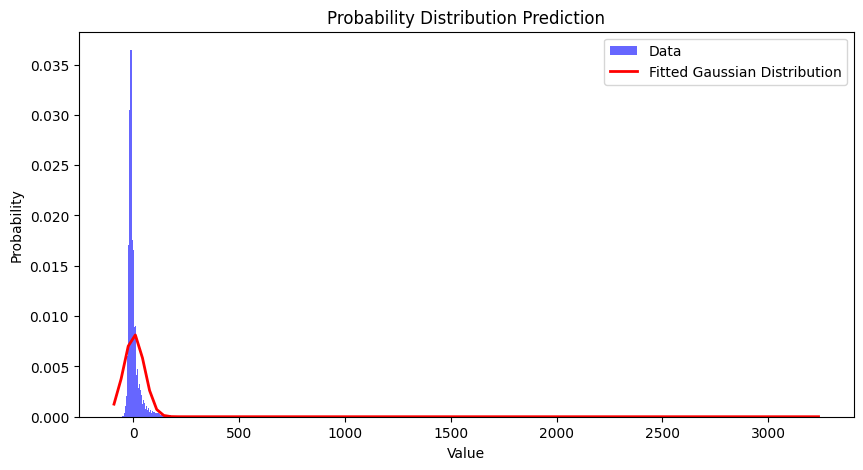

In [72]:
print("----------General feature information----------")
print(df.ArrDelay.describe())
print()
print("----------Value information----------")
print(df.ArrDelay.value_counts())
print("----------Sorted value information----------")
print(df.groupby('ArrDelay').ArrDelay.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='ArrDelay', bins=df['ArrDelay'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('ArrDelay')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each ArrDelay')
#plt.xlim(left=-30, right=180)
plt.show()

data = df.ArrDelay
# Fit a probability distribution (Gaussian distribution) to the data
mu, std = norm.fit(data)

# Create a range of values for the x-axis
x = np.linspace(data.min(), data.max(), 100)

# Calculate the probability density function (PDF) for the fitted Gaussian distribution
pdf = norm.pdf(x, mu, std)

# Plot the data and the fitted distribution
plt.figure(figsize=(10, 5))
plt.hist(data, bins=df['ArrDelay'].nunique(), density=True, alpha=0.6, color='b', label='Data')
plt.plot(x, pdf, 'r-', lw=2, label='Fitted Gaussian Distribution')
plt.title('Probability Distribution Prediction')
plt.xlabel('Value')
plt.ylabel('Probability')
#plt.xlim(left=-30, right=180)
plt.legend()
plt.show()

In [73]:
min_value = df['ArrDelay'].min()
max_value = df['ArrDelay'].max()

# Display the result
print(f"The minimum value in the 'ArrDelay' column is: {min_value}")
print(f"The minimum value in the 'ArrDelay' column is: {max_value}")

The minimum value in the 'ArrDelay' column is: -90.0
The minimum value in the 'ArrDelay' column is: 3237.0


In [74]:
df_filtered = df[(df['ArrDelay'] >= -30.0) & (df['ArrDelay'] <= 180.0)]
data_1D_dep = data_1D_dep.merge(df_filtered[['ArrDelay']], left_index=True, right_index=True, how='inner')
data_1M_dep = data_1M_dep.merge(df_filtered[['ArrDelay']], left_index=True, right_index=True, how='inner')
data_1D_arr = data_1D_arr.merge(df_filtered[['ArrDelay']], left_index=True, right_index=True, how='inner')
data_1M_arr = data_1M_arr.merge(df_filtered[['ArrDelay']], left_index=True, right_index=True, how='inner')

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/2812310410.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data_1D_arr, x='ArrDelay', bins=data_1D_arr['ArrDelay'].nunique(),


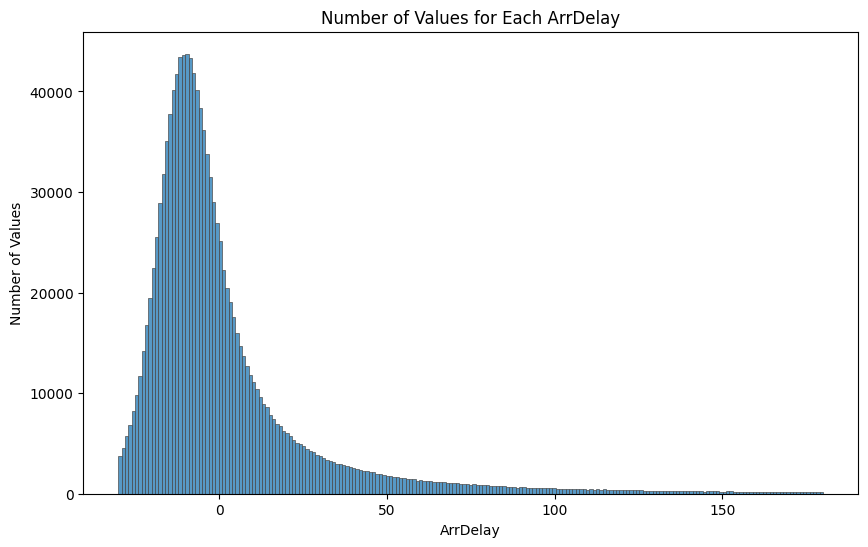

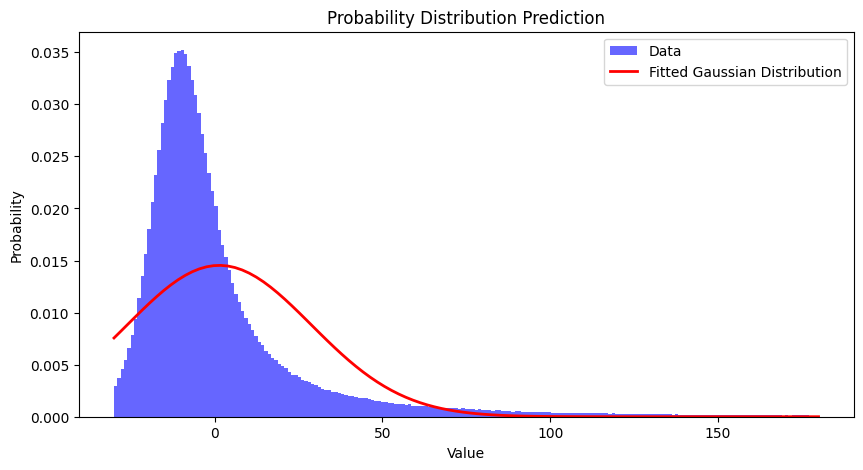

In [75]:
plt.figure(figsize=(10, 6))
sns.histplot(data=data_1D_arr, x='ArrDelay', bins=data_1D_arr['ArrDelay'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('ArrDelay')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each ArrDelay')
plt.show()

data = data_1D_arr.ArrDelay

# Fit a probability distribution (Gaussian distribution) to the data
mu, std = norm.fit(data)

# Create a range of values for the x-axis
x = np.linspace(data.min(), data.max(), 100)

# Calculate the probability density function (PDF) for the fitted Gaussian distribution
pdf = norm.pdf(x, mu, std)

# Plot the data and the fitted distribution
plt.figure(figsize=(10, 5))
plt.hist(data, bins=data_1D_arr['ArrDelay'].nunique(), density=True, alpha=0.6, color='b', label='Data')
plt.plot(x, pdf, 'r-', lw=2, label='Fitted Gaussian Distribution')
plt.title('Probability Distribution Prediction')
plt.xlabel('Value')
plt.ylabel('Probability')
plt.legend()
plt.show()

In [76]:
data_1D_arr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1248607 entries, 0 to 1276176
Data columns (total 29 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   Year               1248607 non-null  int64  
 1   Month_sin          1248607 non-null  float64
 2   Month_cos          1248607 non-null  float64
 3   DayOfMonth_sin     1248607 non-null  float64
 4   DayOfMonth_cos     1248607 non-null  float64
 5   DayOfWeek_sin      1248607 non-null  float64
 6   DayOfWeek_cos      1248607 non-null  float64
 7   Airline_9E         1248607 non-null  int64  
 8   Airline_AA         1248607 non-null  int64  
 9   Airline_AS         1248607 non-null  int64  
 10  Airline_B6         1248607 non-null  int64  
 11  Airline_DL         1248607 non-null  int64  
 12  Airline_F9         1248607 non-null  int64  
 13  Airline_MQ         1248607 non-null  int64  
 14  Airline_NK         1248607 non-null  int64  
 15  Airline_OH         1248607 non-null  

In [77]:
data_1D_arr.head()

,Year,Month_sin,Month_cos,DayOfMonth_sin,DayOfMonth_cos,DayOfWeek_sin,DayOfWeek_cos,Airline_9E,Airline_AA,Airline_AS,Airline_B6,Airline_DL,Airline_F9,Airline_MQ,Airline_NK,Airline_OH,Airline_OO,Airline_UA,Airline_WN,Airline_YV,Airline_YX,OriginAirportID,DestAirportID,CRSDepTime_sin,CRSDepTime_cos,DepTimeBlkEncoded,CRSArrTime_sin,CRSArrTime_cos,ArrDelay
0,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,10397,11278,-0.902585,-0.430511,11,-0.996917,0.078459,-13.0
2,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11278,10397,-0.382683,-0.923880,8,-0.788548,-0.614974,-5.0
3,2021,-0.866025,-0.5,-0.571268,0.820763,-0.781831,0.62349,0,0,0,0,0,0,0,0,1,0,0,0,0,0,11278,10397,-0.382683,-0.923880,8,-0.788548,-0.614974,-14.0
4,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,0,1,0,0,0,0,12266,10397,0.608761,-0.793353,4,-0.146083,-0.989272,-2.0
5,2021,-0.866025,-0.5,-0.897805,-0.440394,-0.781831,0.62349,0,0,0,0,0,0,0,0,0,1,0,0,0,0,10397,13930,-0.358368,-0.933580,8,-0.617036,-0.786935,-13.0


### ArrivalDelayGroups

----------General feature information----------
count    1.276177e+06
mean    -2.655940e-01
std      2.209819e+00
min     -2.000000e+00
25%     -1.000000e+00
50%     -1.000000e+00
75%      0.000000e+00
max      1.200000e+01
Name: ArrivalDelayGroups, dtype: float64

----------Value information----------
ArrivalDelayGroups
-2.0     259544
-1.0     571550
 0.0     221983
 1.0      83829
 2.0      43059
 3.0      25831
 4.0      16955
 5.0      11850
 6.0       8442
 7.0       6479
 8.0       4834
 9.0       3694
 10.0      2991
 11.0      2282
 12.0     12854
Name: count, dtype: int64


/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/2146300872.py:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='ArrivalDelayGroups', bins=14,


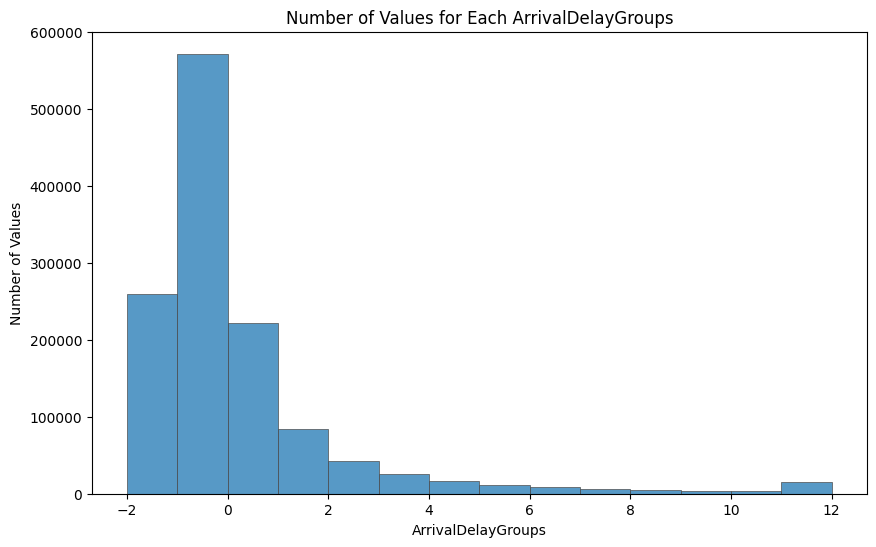

In [78]:
print("----------General feature information----------")
print(df.ArrivalDelayGroups.describe())
print()
print("----------Value information----------")
print(df.groupby('ArrivalDelayGroups').ArrivalDelayGroups.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='ArrivalDelayGroups', bins=14,
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('ArrivalDelayGroups')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each ArrivalDelayGroups')
plt.show()

In [79]:
#data_1D_arr['ArrivalDelayGroups'] = data_1D_dep['ArrivalDelayGroups'] = data_1M_arr['ArrivalDelayGroups'] = data_1M_dep['ArrivalDelayGroups'] = df['ArrivalDelayGroups']
#data_1D_arr.info()

### ArrTimeBlk

----------General feature information----------
count       1276177
unique           19
top       0900-0959
freq          84279
Name: ArrTimeBlk, dtype: object

----------Value information----------
ArrTimeBlk
0001-0559    35873
0600-0659    13798
0700-0759    51412
0800-0859    81928
0900-0959    84279
1000-1059    73147
1100-1159    79119
1200-1259    77686
1300-1359    70218
1400-1459    76833
1500-1559    73426
1600-1659    71672
1700-1759    65811
1800-1859    82033
1900-1959    63612
2000-2059    76143
2100-2159    79942
2200-2259    55523
2300-2359    63722
Name: count, dtype: int64


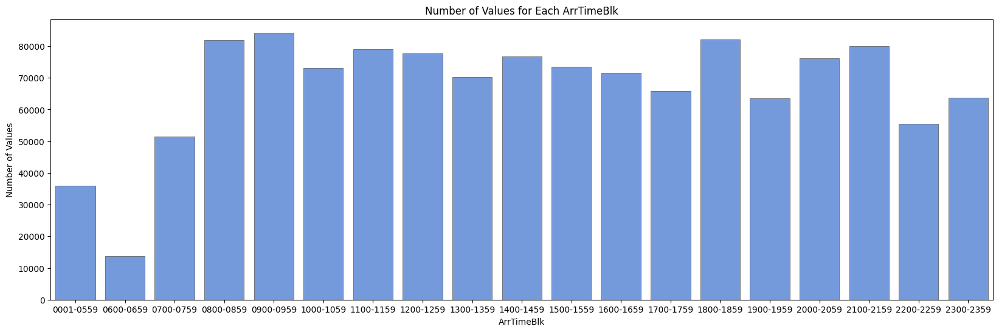

In [80]:
print("----------General feature information----------")
print(df.ArrTimeBlk.describe())
print()
print("----------Value information----------")
print(df.groupby('ArrTimeBlk').ArrTimeBlk.value_counts())

# Sort the time blocks for plotting
sorted_time_blocks = df.groupby('ArrTimeBlk').indices

plt.figure(figsize=(20, 6))
sns.countplot(data=df, x='ArrTimeBlk', color="cornflowerblue", edgecolor=".3", linewidth=.5, order=sorted_time_blocks)
plt.xlabel('ArrTimeBlk')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each ArrTimeBlk')
plt.show()

In [81]:
print(df.groupby('ArrTimeBlk').ArrTimeBlk.unique())

ArrTimeBlk
0001-0559    [0001-0559]
0600-0659    [0600-0659]
0700-0759    [0700-0759]
0800-0859    [0800-0859]
0900-0959    [0900-0959]
1000-1059    [1000-1059]
1100-1159    [1100-1159]
1200-1259    [1200-1259]
1300-1359    [1300-1359]
1400-1459    [1400-1459]
1500-1559    [1500-1559]
1600-1659    [1600-1659]
1700-1759    [1700-1759]
1800-1859    [1800-1859]
1900-1959    [1900-1959]
2000-2059    [2000-2059]
2100-2159    [2100-2159]
2200-2259    [2200-2259]
2300-2359    [2300-2359]
Name: ArrTimeBlk, dtype: object


In [82]:
# Perform one-hot encoding
# arr_time_blocks_encoded = pd.get_dummies(df['ArrTimeBlk'], prefix='ArrTimeBlk')

arr_time_block_mapping = {
    '0001-0559': 0,
    '0600-0659': 1,
    '0700-0759': 2,
    '0800-0859': 3,
    '0900-0959': 4,
    '1000-1059': 5,
    '1100-1159': 6,
    '1200-1259': 7,
    '1300-1359': 8,
    '1400-1459': 9,
    '1500-1559': 10,
    '1600-1659': 11,
    '1700-1759': 12,
    '1800-1859': 13,
    '1900-1959': 14,
    '2000-2059': 15,
    '2100-2159': 16,
    '2200-2259': 17,
    '2300-2359': 18
}

arr_time_blocks_encoded = df['ArrTimeBlk'].map(arr_time_block_mapping)

# Concatenate the encoded columns to the original DataFrame
data_1D_arr = pd.concat([data_1D_arr, arr_time_blocks_encoded.rename('ArrTimeBlkEncoded')], axis=1)
data_1D_dep = pd.concat([data_1D_dep, arr_time_blocks_encoded.rename('ArrTimeBlkEncoded')], axis=1)
data_1M_arr = pd.concat([data_1M_arr, arr_time_blocks_encoded.rename('ArrTimeBlkEncoded')], axis=1)
data_1M_dep = pd.concat([data_1M_dep, arr_time_blocks_encoded.rename('ArrTimeBlkEncoded')], axis=1)

In [83]:
data_1D_arr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1276177 entries, 0 to 1276132
Data columns (total 30 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   Year               1248607 non-null  float64
 1   Month_sin          1248607 non-null  float64
 2   Month_cos          1248607 non-null  float64
 3   DayOfMonth_sin     1248607 non-null  float64
 4   DayOfMonth_cos     1248607 non-null  float64
 5   DayOfWeek_sin      1248607 non-null  float64
 6   DayOfWeek_cos      1248607 non-null  float64
 7   Airline_9E         1248607 non-null  float64
 8   Airline_AA         1248607 non-null  float64
 9   Airline_AS         1248607 non-null  float64
 10  Airline_B6         1248607 non-null  float64
 11  Airline_DL         1248607 non-null  float64
 12  Airline_F9         1248607 non-null  float64
 13  Airline_MQ         1248607 non-null  float64
 14  Airline_NK         1248607 non-null  float64
 15  Airline_OH         1248607 non-null  

### CRSElapsedTime

----------General feature information----------
count    1.276177e+06
mean     1.234848e+02
std      5.918160e+01
min      3.800000e+01
25%      8.500000e+01
50%      1.110000e+02
75%      1.370000e+02
max      6.240000e+02
Name: CRSElapsedTime, dtype: float64

----------Value information----------
CRSElapsedTime
90.0     26259
115.0    25091
120.0    24337
110.0    23630
95.0     21128
125.0    19042
85.0     18384
105.0    17680
100.0    16534
80.0     16469
70.0     15565
130.0    14874
119.0    14568
117.0    14335
135.0    14290
118.0    13742
75.0     13631
114.0    12590
113.0    12439
121.0    12279
92.0     12164
116.0    12127
91.0     11810
93.0     11688
94.0     11508
89.0     11454
65.0     11415
112.0    11376
140.0    11361
79.0     11323
124.0    11228
111.0    11205
88.0     11059
122.0    11018
87.0     10914
69.0     10700
71.0     10668
109.0    10576
81.0     10475
78.0     10461
108.0    10444
129.0    10383
123.0    10304
72.0     10229
74.0     10196
73.0     1

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/4232257172.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='CRSElapsedTime', bins=df['CRSElapsedTime'].nunique(),


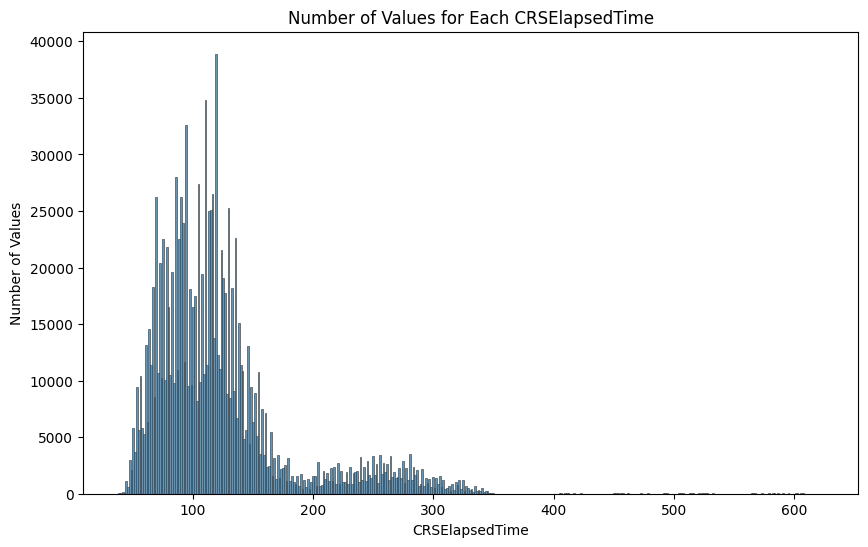

In [84]:
print("----------General feature information----------")
print(df.CRSElapsedTime.describe())
print()
print("----------Value information----------")
print(df.CRSElapsedTime.value_counts())
print()
print("----------Sorted value information----------")
print(df.groupby('CRSElapsedTime').CRSElapsedTime.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='CRSElapsedTime', bins=df['CRSElapsedTime'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('CRSElapsedTime')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each CRSElapsedTime')
plt.show()

Remember to scale this after splitting

In [85]:
data_1D_arr['CRSElapsedTime'] = data_1D_dep['CRSElapsedTime'] = data_1M_arr['CRSElapsedTime'] = data_1M_dep['CRSElapsedTime'] = df['CRSElapsedTime']
data_1D_arr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1276177 entries, 0 to 1276132
Data columns (total 31 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   Year               1248607 non-null  float64
 1   Month_sin          1248607 non-null  float64
 2   Month_cos          1248607 non-null  float64
 3   DayOfMonth_sin     1248607 non-null  float64
 4   DayOfMonth_cos     1248607 non-null  float64
 5   DayOfWeek_sin      1248607 non-null  float64
 6   DayOfWeek_cos      1248607 non-null  float64
 7   Airline_9E         1248607 non-null  float64
 8   Airline_AA         1248607 non-null  float64
 9   Airline_AS         1248607 non-null  float64
 10  Airline_B6         1248607 non-null  float64
 11  Airline_DL         1248607 non-null  float64
 12  Airline_F9         1248607 non-null  float64
 13  Airline_MQ         1248607 non-null  float64
 14  Airline_NK         1248607 non-null  float64
 15  Airline_OH         1248607 non-null  

### ActualElapsedTime

In [86]:
print("----------General feature information----------")
print(df.ActualElapsedTime.describe())
print()
print("----------Value information----------")
print(df.ActualElapsedTime.value_counts())
print()
print("----------Sorted value information----------")
print(df.groupby('ActualElapsedTime').ActualElapsedTime.value_counts())

----------General feature information----------
count    1.276177e+06
mean     1.171254e+02
std      5.945961e+01
min      3.000000e+01
25%      7.900000e+01
50%      1.040000e+02
75%      1.310000e+02
max      7.190000e+02
Name: ActualElapsedTime, dtype: float64

----------Value information----------
ActualElapsedTime
106.0    14403
108.0    14396
103.0    14280
105.0    14215
104.0    14196
107.0    14176
109.0    14170
110.0    14086
111.0    13990
102.0    13970
112.0    13660
113.0    13524
101.0    13483
100.0    13161
114.0    13075
81.0     13074
99.0     13051
83.0     12973
115.0    12972
82.0     12912
116.0    12821
80.0     12795
84.0     12760
98.0     12691
85.0     12545
79.0     12424
117.0    12292
97.0     12275
86.0     12223
96.0     12164
118.0    12141
119.0    12088
78.0     12059
77.0     11962
87.0     11852
95.0     11760
94.0     11694
88.0     11692
120.0    11620
90.0     11473
89.0     11444
92.0     11386
76.0     11358
121.0    11358
93.0     11339
91.0

### AirTime

----------General feature information----------
count    1.276177e+06
mean     9.395357e+01
std      5.756855e+01
min      1.600000e+01
25%      5.800000e+01
50%      8.200000e+01
75%      1.060000e+02
max      6.300000e+02
Name: AirTime, dtype: float64

----------Value information----------
AirTime
83.0     17938
85.0     17804
84.0     17799
82.0     17698
81.0     17262
86.0     16914
87.0     16193
80.0     16158
62.0     15816
63.0     15725
88.0     15680
64.0     15580
61.0     15332
89.0     15117
60.0     14876
79.0     14701
90.0     14372
65.0     14296
42.0     14072
43.0     13993
59.0     13890
91.0     13884
78.0     13725
92.0     13602
41.0     13385
66.0     13280
93.0     13017
58.0     13016
44.0     12982
94.0     12775
77.0     12735
95.0     12456
96.0     12395
67.0     12210
97.0     12163
40.0     11980
57.0     11936
76.0     11868
98.0     11856
99.0     11680
100.0    11650
45.0     11612
68.0     11363
101.0    11288
75.0     11257
56.0     10882
103.0    

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/659607744.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='AirTime', bins=df['AirTime'].nunique(),


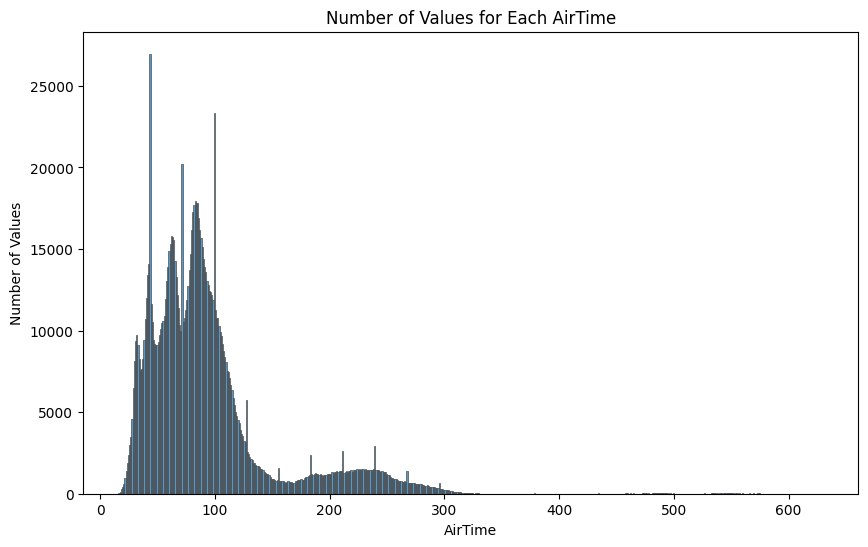

In [87]:
print("----------General feature information----------")
print(df.AirTime.describe())
print()
print("----------Value information----------")
print(df.AirTime.value_counts())
print()
print("----------Sorted value information----------")
print(df.groupby('AirTime').AirTime.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='AirTime', bins=df['AirTime'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('AirTime')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each AirTime')
plt.show()

### Flights

In [88]:
print("----------General feature information----------")
print(df.Flights.describe())
print()
print("----------Value information----------")
print(df.Flights.value_counts())
print()
print("----------Sorted value information----------")
print(df.groupby('Flights').Flights.value_counts())

----------General feature information----------
count    1276177.0
mean           1.0
std            0.0
min            1.0
25%            1.0
50%            1.0
75%            1.0
max            1.0
Name: Flights, dtype: float64

----------Value information----------
Flights
1.0    1276177
Name: count, dtype: int64

----------Sorted value information----------
Flights
1.0    1276177
Name: count, dtype: int64


### Distance

----------General feature information----------
count    1.276177e+06
mean     6.674630e+02
std      4.914569e+02
min      8.300000e+01
25%      3.560000e+02
50%      5.660000e+02
75%      7.600000e+02
max      4.502000e+03
Name: Distance, dtype: float64

----------Value information----------
Distance
594.0     45152
404.0     31605
762.0     30191
581.0     28898
214.0     25914
547.0     25811
406.0     24330
746.0     23617
606.0     23281
731.0     22906
1199.0    22492
666.0     21584
577.0     21528
1947.0    20241
226.0     19968
946.0     18332
689.0     18164
1747.0    17993
432.0     17416
425.0     16611
270.0     16351
356.0     16051
692.0     15195
545.0     15094
813.0     14741
907.0     14296
760.0     14227
534.0     13697
1587.0    13256
332.0     12776
2182.0    12775
721.0     12738
481.0     12715
153.0     12444
341.0     12360
515.0     12347
591.0     12194
554.0     12168
484.0     12138
1590.0    11580
321.0     11473
696.0     11181
874.0     11074
259.0    

/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/1771329319.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='Distance', bins=df['Distance'].nunique(),


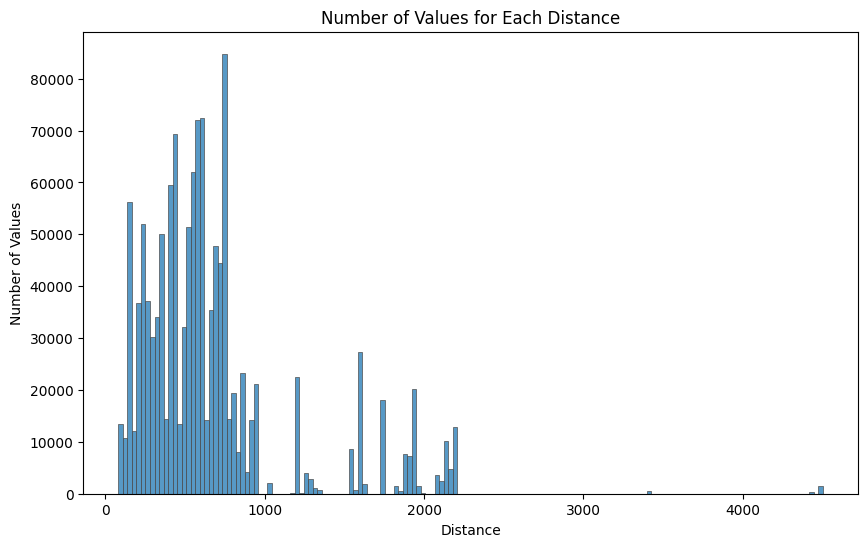

In [89]:
print("----------General feature information----------")
print(df.Distance.describe())
print()
print("----------Value information----------")
print(df.Distance.value_counts())
print()
print("----------Sorted value information----------")
print(df.groupby('Distance').Distance.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='Distance', bins=df['Distance'].nunique(),
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('Distance')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each Distance')
plt.show()

In [90]:
data_1D_arr['Distance'] = data_1D_dep['Distance'] = data_1M_arr['Distance'] = data_1M_dep['Distance'] = df['Distance']
data_1D_arr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1276177 entries, 0 to 1276132
Data columns (total 32 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   Year               1248607 non-null  float64
 1   Month_sin          1248607 non-null  float64
 2   Month_cos          1248607 non-null  float64
 3   DayOfMonth_sin     1248607 non-null  float64
 4   DayOfMonth_cos     1248607 non-null  float64
 5   DayOfWeek_sin      1248607 non-null  float64
 6   DayOfWeek_cos      1248607 non-null  float64
 7   Airline_9E         1248607 non-null  float64
 8   Airline_AA         1248607 non-null  float64
 9   Airline_AS         1248607 non-null  float64
 10  Airline_B6         1248607 non-null  float64
 11  Airline_DL         1248607 non-null  float64
 12  Airline_F9         1248607 non-null  float64
 13  Airline_MQ         1248607 non-null  float64
 14  Airline_NK         1248607 non-null  float64
 15  Airline_OH         1248607 non-null  

### DistanceGroup

----------General feature information----------
count    1.276177e+06
mean     3.146042e+00
std      1.893877e+00
min      1.000000e+00
25%      2.000000e+00
50%      3.000000e+00
75%      4.000000e+00
max      1.100000e+01
Name: DistanceGroup, dtype: float64

----------Value information----------
DistanceGroup
3     439058
2     341314
1     173268
4     157697
7      56766
8      38674
9      33790
5      24781
6       8568
11      2261
Name: count, dtype: int64

----------Sorted value information----------
DistanceGroup
1     173268
2     341314
3     439058
4     157697
5      24781
6       8568
7      56766
8      38674
9      33790
11      2261
Name: count, dtype: int64


/var/folders/k_/7tyv0nps0tn9zv3mhhdms5y80000gn/T/ipykernel_9973/1423723118.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x='DistanceGroup', bins=10,


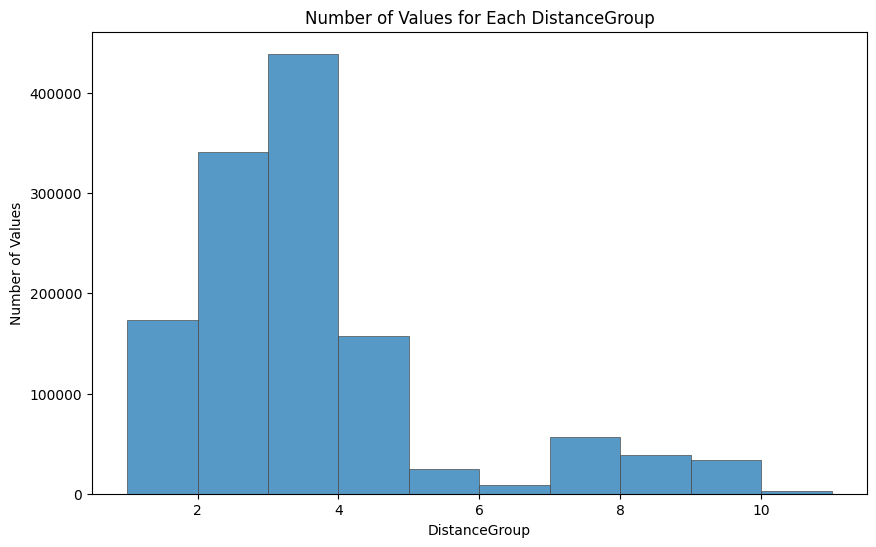

In [91]:
print("----------General feature information----------")
print(df.DistanceGroup.describe())
print()
print("----------Value information----------")
print(df.DistanceGroup.value_counts())
print()
print("----------Sorted value information----------")
print(df.groupby('DistanceGroup').DistanceGroup.value_counts())

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='DistanceGroup', bins=10,
             stat='count', palette="light:m_r", edgecolor=".3", linewidth=.5)
plt.xlabel('DistanceGroup')
plt.ylabel('Number of Values')
plt.title('Number of Values for Each DistanceGroup')
plt.show()

In [92]:
data_1D_arr['DistanceGroup'] = data_1D_dep['DistanceGroup'] = data_1M_arr['DistanceGroup'] = data_1M_dep['DistanceGroup'] = df['DistanceGroup']
data_1D_arr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1276177 entries, 0 to 1276132
Data columns (total 33 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   Year               1248607 non-null  float64
 1   Month_sin          1248607 non-null  float64
 2   Month_cos          1248607 non-null  float64
 3   DayOfMonth_sin     1248607 non-null  float64
 4   DayOfMonth_cos     1248607 non-null  float64
 5   DayOfWeek_sin      1248607 non-null  float64
 6   DayOfWeek_cos      1248607 non-null  float64
 7   Airline_9E         1248607 non-null  float64
 8   Airline_AA         1248607 non-null  float64
 9   Airline_AS         1248607 non-null  float64
 10  Airline_B6         1248607 non-null  float64
 11  Airline_DL         1248607 non-null  float64
 12  Airline_F9         1248607 non-null  float64
 13  Airline_MQ         1248607 non-null  float64
 14  Airline_NK         1248607 non-null  float64
 15  Airline_OH         1248607 non-null  

### CarrierDelay

In [93]:
print("----------General feature information----------")
print(df.CarrierDelay.describe())
print()
print("----------Value information----------")
print(df.CarrierDelay.value_counts())
print()
print("----------Sorted value information----------")
print(df.groupby('CarrierDelay').CarrierDelay.value_counts())

----------General feature information----------
count    223100.000000
mean         31.276190
std          78.894703
min           0.000000
25%           0.000000
50%          10.000000
75%          31.000000
max        3221.000000
Name: CarrierDelay, dtype: float64

----------Value information----------
CarrierDelay
0.0       82931
15.0       4410
16.0       4040
17.0       3791
18.0       3632
6.0        3313
19.0       3207
7.0        3182
20.0       3139
8.0        2991
10.0       2916
9.0        2864
21.0       2816
2.0        2783
22.0       2781
3.0        2745
1.0        2734
4.0        2730
5.0        2718
11.0       2631
12.0       2623
23.0       2526
13.0       2440
14.0       2440
24.0       2399
25.0       2263
26.0       2084
28.0       1980
27.0       1927
29.0       1866
30.0       1706
31.0       1643
32.0       1551
33.0       1461
34.0       1432
35.0       1321
36.0       1303
37.0       1186
38.0       1181
40.0       1131
41.0       1107
39.0       1098
42.0     

### WeatherDelay

In [94]:
print("----------General feature information----------")
print(df.WeatherDelay.describe())
print()
print("----------Value information----------")
print(df.WeatherDelay.value_counts())
print()
print("----------Sorted value information----------")
print(df.groupby('WeatherDelay').WeatherDelay.value_counts())

----------General feature information----------
count    223100.000000
mean          3.672403
std          31.253915
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max        1280.000000
Name: WeatherDelay, dtype: float64

----------Value information----------
WeatherDelay
0.0       210854
16.0         264
15.0         248
17.0         244
20.0         244
21.0         236
18.0         235
19.0         232
28.0         212
10.0         211
22.0         209
24.0         204
7.0          199
25.0         189
8.0          188
12.0         187
13.0         186
9.0          180
30.0         180
6.0          179
26.0         179
23.0         177
14.0         167
2.0          163
29.0         160
5.0          159
11.0         159
27.0         157
31.0         156
33.0         152
1.0          151
3.0          149
34.0         138
4.0          134
42.0         134
36.0         132
35.0         132
32.0         127
40.0         126
39.0         125
3

### NASDelay

In [95]:
print("----------General feature information----------")
print(df.NASDelay.describe())
print()
print("----------Value information----------")
print(df.NASDelay.value_counts())
print()
print("----------Sorted value information----------")
print(df.groupby('NASDelay').NASDelay.value_counts())

----------General feature information----------
count    223100.000000
mean         10.456114
std          27.469452
min           0.000000
25%           0.000000
50%           0.000000
75%          13.000000
max        1300.000000
Name: NASDelay, dtype: float64

----------Value information----------
NASDelay
0.0       124926
1.0         6385
2.0         4548
3.0         4193
15.0        3830
4.0         3820
5.0         3570
16.0        3481
6.0         3333
17.0        3076
7.0         3064
18.0        2817
8.0         2791
9.0         2644
19.0        2530
10.0        2508
20.0        2380
21.0        2152
11.0        2151
12.0        2027
22.0        1892
23.0        1759
13.0        1746
14.0        1573
24.0        1555
25.0        1460
26.0        1396
27.0        1292
28.0        1235
29.0        1112
30.0        1048
31.0         959
32.0         898
33.0         831
34.0         801
35.0         676
36.0         658
37.0         641
39.0         621
38.0         594
40.0     

### SecurityDelay

In [96]:
print("----------General feature information----------")
print(df.SecurityDelay.describe())
print()
print("----------Value information----------")
print(df.SecurityDelay.value_counts())
print()
print("----------Sorted value information----------")
print(df.groupby('SecurityDelay').SecurityDelay.value_counts())

----------General feature information----------
count    223100.000000
mean          0.158391
std           4.753562
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max        1132.000000
Name: SecurityDelay, dtype: float64

----------Value information----------
SecurityDelay
0.0       222193
15.0          27
10.0          27
18.0          26
30.0          25
17.0          25
33.0          23
8.0           22
23.0          22
19.0          22
21.0          21
26.0          20
22.0          19
7.0           18
11.0          18
12.0          18
16.0          18
20.0          18
35.0          17
6.0           17
34.0          17
9.0           17
3.0           16
24.0          16
14.0          15
4.0           15
25.0          14
42.0          13
41.0          13
5.0           13
37.0          12
36.0          12
27.0          11
28.0          11
39.0          11
32.0          11
31.0          10
13.0          10
55.0           9
51.0           9

### LateAircraftDelay

In [97]:
print("----------General feature information----------")
print(df.LateAircraftDelay.describe())
print()
print("----------Value information----------")
print(df.LateAircraftDelay.value_counts())
print()
print("----------Sorted value information----------")
print(df.groupby('LateAircraftDelay').LateAircraftDelay.value_counts())

----------General feature information----------
count    223100.000000
mean         20.104890
std          46.280708
min           0.000000
25%           0.000000
50%           0.000000
75%          23.000000
max        2216.000000
Name: LateAircraftDelay, dtype: float64

----------Value information----------
LateAircraftDelay
0.0       127642
15.0        2544
16.0        2417
17.0        2294
18.0        2110
19.0        2043
20.0        2028
21.0        1932
14.0        1801
13.0        1768
22.0        1716
9.0         1672
8.0         1667
23.0        1662
6.0         1652
12.0        1632
11.0        1611
10.0        1602
2.0         1594
7.0         1590
24.0        1577
25.0        1538
5.0         1517
1.0         1514
26.0        1489
4.0         1461
3.0         1460
27.0        1447
28.0        1367
29.0        1331
30.0        1210
31.0        1180
33.0        1090
32.0        1087
34.0        1064
36.0        1026
35.0        1000
37.0         973
38.0         922
41.0    

### DelayReason

In [98]:
# Create a boolean mask for cases where there is CarrierDelay and it is not 0.0
mask_carrier_delay = (df['CarrierDelay'].notnull()) & (df['CarrierDelay'] != 0.0)

# Check if DepDelay is the same as CarrierDelay
dep_delay_same_as_carrier_delay = df.loc[mask_carrier_delay, 'DepDelay'] == df.loc[mask_carrier_delay, 'CarrierDelay']

# Check if ArrDelay is the same as CarrierDelay
arr_delay_same_as_carrier_delay = df.loc[mask_carrier_delay, 'ArrDelay'] == df.loc[mask_carrier_delay, 'CarrierDelay']

# Display the results
print("Cases where DepDelay is the same as non-zero CarrierDelay:")
print(dep_delay_same_as_carrier_delay)

print("\nCases where ArrDelay is the same as non-zero CarrierDelay:")
print(arr_delay_same_as_carrier_delay)

# Select rows where there is non-zero CarrierDelay
df_carrier_delay = df[mask_carrier_delay]

# Display the values for selected columns in the result
print("\nCases where DepDelay is the same as non-zero CarrierDelay:")
print(df_carrier_delay.loc[dep_delay_same_as_carrier_delay, ['ArrDelay', 'DepDelay', 'CarrierDelay']])

print("\nCases where ArrDelay is the same as non-zero CarrierDelay:")
print(df_carrier_delay.loc[arr_delay_same_as_carrier_delay, ['ArrDelay', 'DepDelay', 'CarrierDelay']])


Cases where DepDelay is the same as non-zero CarrierDelay:
8          False
19         False
21         False
23         False
24         False
27         False
28         False
29         False
31         False
33         False
39         False
40         False
41         False
44         False
57         False
59         False
71         False
78         False
83         False
98         False
104        False
110        False
117        False
149        False
163        False
183         True
225         True
244        False
272        False
277        False
281        False
290        False
297        False
298        False
312        False
313        False
314        False
318        False
321        False
336         True
337        False
350        False
351        False
353        False
356        False
358        False
369        False
388        False
391        False
393         True
404        False
437         True
447        False
449         True
460        False
470   

In [99]:
# Create a new column 'DelayReason' with the reason behind the maximum delay
#df['DelayReason'] = df[['CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay', 'LateAircraftDelay']].idxmax(axis=1)

# Replace NaN values with 'No Delay' in case there is no delay in any of the columns
#df['DelayReason'].fillna('NoDelay', inplace=True)

In [100]:
#df.head(10)

In [101]:
# One-hot encode the 'DelayReason' column
#df_encoded = pd.get_dummies(df[['DelayReason']], prefix='DelayReason')

# Assuming 'df_result' is another DataFrame where you want to save the encoded column
#data_1D_arr = pd.concat([data_1D_arr, df_encoded], axis=1)
#data_1D_dep = pd.concat([data_1D_dep, df_encoded], axis=1)
#data_1M_arr = pd.concat([data_1M_arr, df_encoded], axis=1)
#data_1M_dep = pd.concat([data_1M_dep, df_encoded], axis=1)

In [102]:
#data_1D_arr.head(10)

In [103]:
data_1D_arr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1276177 entries, 0 to 1276132
Data columns (total 33 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   Year               1248607 non-null  float64
 1   Month_sin          1248607 non-null  float64
 2   Month_cos          1248607 non-null  float64
 3   DayOfMonth_sin     1248607 non-null  float64
 4   DayOfMonth_cos     1248607 non-null  float64
 5   DayOfWeek_sin      1248607 non-null  float64
 6   DayOfWeek_cos      1248607 non-null  float64
 7   Airline_9E         1248607 non-null  float64
 8   Airline_AA         1248607 non-null  float64
 9   Airline_AS         1248607 non-null  float64
 10  Airline_B6         1248607 non-null  float64
 11  Airline_DL         1248607 non-null  float64
 12  Airline_F9         1248607 non-null  float64
 13  Airline_MQ         1248607 non-null  float64
 14  Airline_NK         1248607 non-null  float64
 15  Airline_OH         1248607 non-null  

## Multivariable Exploration

<Axes: >

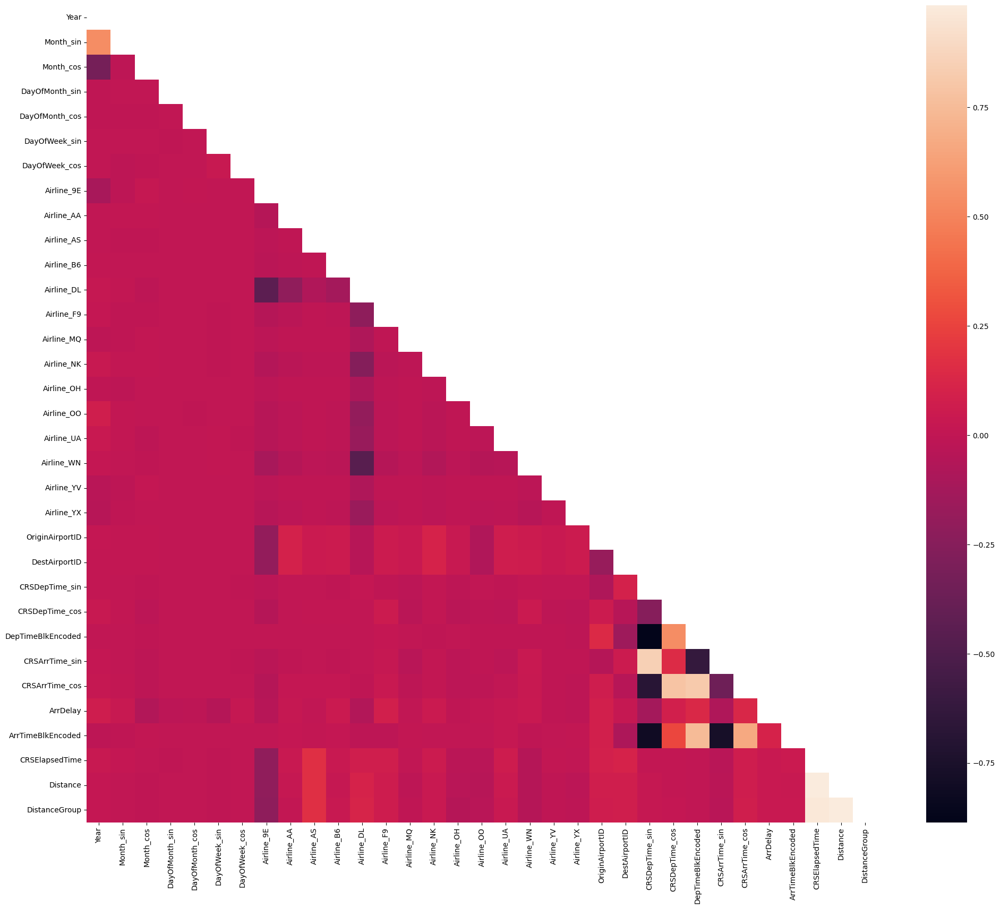

In [104]:
corr = np.corrcoef(np.random.randn(33, 330))
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(24,20))
sns.heatmap(data_1D_arr.corr(), mask=mask, ax=ax)

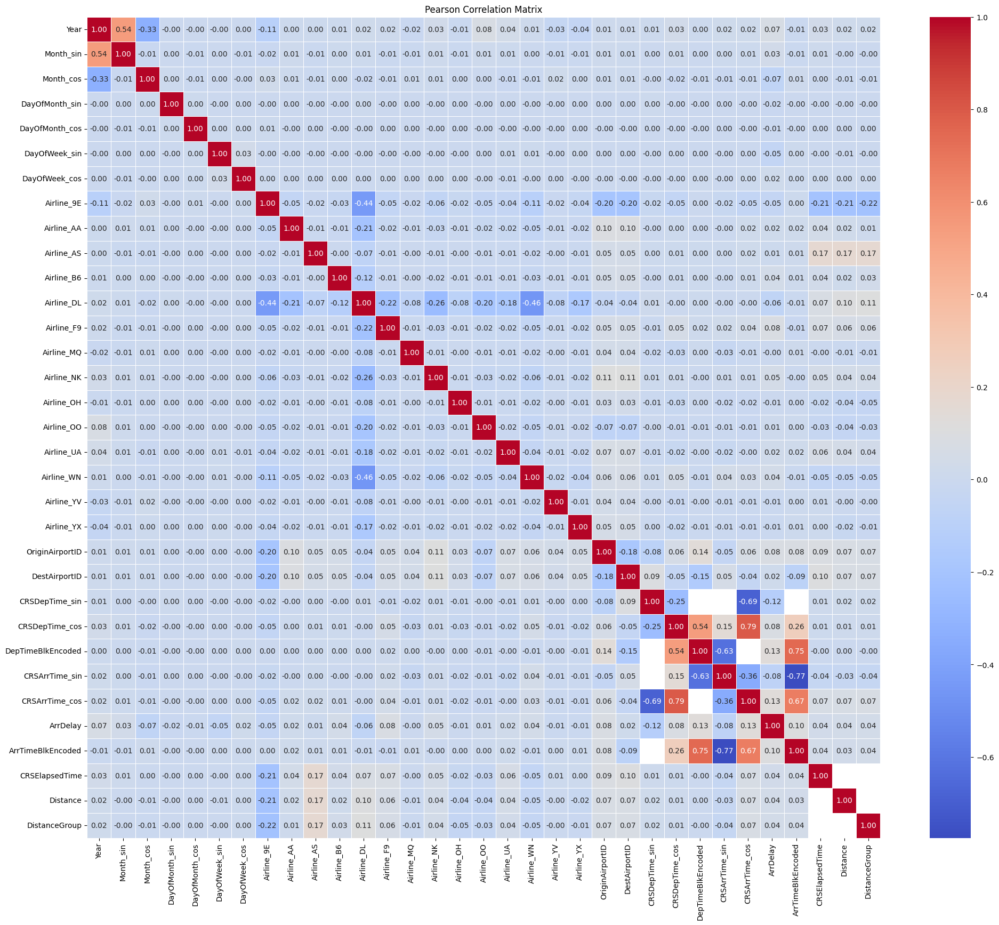

In [105]:
correlation_matrix = data_1D_arr.corr()

is_annot = (correlation_matrix >= 0.8) | (correlation_matrix <= -0.8)

# Create a heatmap
plt.figure(figsize=(24, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5,
            mask=(is_annot) & (correlation_matrix != 1),
            fmt=".2f")
plt.title('Pearson Correlation Matrix')
plt.show()

In [106]:
print(data_1D_arr.isnull().sum())

Year                 27570
Month_sin            27570
Month_cos            27570
DayOfMonth_sin       27570
DayOfMonth_cos       27570
DayOfWeek_sin        27570
DayOfWeek_cos        27570
Airline_9E           27570
Airline_AA           27570
Airline_AS           27570
Airline_B6           27570
Airline_DL           27570
Airline_F9           27570
Airline_MQ           27570
Airline_NK           27570
Airline_OH           27570
Airline_OO           27570
Airline_UA           27570
Airline_WN           27570
Airline_YV           27570
Airline_YX           27570
OriginAirportID      27570
DestAirportID        27570
CRSDepTime_sin       27570
CRSDepTime_cos       27570
DepTimeBlkEncoded    27570
CRSArrTime_sin       27570
CRSArrTime_cos       27570
ArrDelay             27570
ArrTimeBlkEncoded        0
CRSElapsedTime           0
Distance                 0
DistanceGroup            0
dtype: int64


# 3 Encoding

## 3.1 Cyclical Encoding

# Splitting the Dataframes

In [107]:
data_1D_arr.dropna(inplace=True)
data_1D_dep.dropna(inplace=True)
data_1M_arr.dropna(inplace=True)
data_1M_dep.dropna(inplace=True)

In [108]:
data_1D_arr = data_1D_arr.sample(frac=0.025, random_state=0)
data_1D_dep = data_1D_dep.sample(frac=0.025, random_state=0)
data_1M_arr = data_1M_arr.sample(frac=0.025, random_state=0)
data_1M_dep = data_1M_dep.sample(frac=0.025, random_state=0)

In [109]:
data_1D_arr_x, data_1D_dep_x, data_1M_arr_x, data_1M_dep_x = data_1D_arr.drop('ArrDelay', axis = 1), data_1D_dep.drop('DepDelay', axis = 1), data_1M_arr.drop('ArrDelay', axis = 1), data_1M_dep.drop('DepDelay', axis = 1)

In [110]:
data_1D_arr_y = data_1M_arr_y = data_1D_arr['ArrDelay']
data_1D_dep_y = data_1M_dep_y = data_1M_dep['DepDelay']

In [111]:
data_1D_arr_x.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31215 entries, 215586 to 140590
Data columns (total 32 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               31215 non-null  float64
 1   Month_sin          31215 non-null  float64
 2   Month_cos          31215 non-null  float64
 3   DayOfMonth_sin     31215 non-null  float64
 4   DayOfMonth_cos     31215 non-null  float64
 5   DayOfWeek_sin      31215 non-null  float64
 6   DayOfWeek_cos      31215 non-null  float64
 7   Airline_9E         31215 non-null  float64
 8   Airline_AA         31215 non-null  float64
 9   Airline_AS         31215 non-null  float64
 10  Airline_B6         31215 non-null  float64
 11  Airline_DL         31215 non-null  float64
 12  Airline_F9         31215 non-null  float64
 13  Airline_MQ         31215 non-null  float64
 14  Airline_NK         31215 non-null  float64
 15  Airline_OH         31215 non-null  float64
 16  Airline_OO         31

# Scaling

In [112]:
nscaler = preprocessing.MinMaxScaler()
data_1D_arr_x.iloc[:,:], data_1D_dep_x.iloc[:,:], data_1M_arr_x.iloc[:,:], data_1M_dep_x.iloc[:,:] = nscaler.fit_transform(data_1D_arr_x.iloc[:,:]), nscaler.fit_transform(data_1D_dep_x.iloc[:,:]), nscaler.fit_transform(data_1M_arr_x.iloc[:,:]), nscaler.fit_transform(data_1M_dep_x.iloc[:,:])

data_1D_arr_x.describe()

,Year,Month_sin,Month_cos,DayOfMonth_sin,DayOfMonth_cos,DayOfWeek_sin,DayOfWeek_cos,Airline_9E,Airline_AA,Airline_AS,Airline_B6,Airline_DL,Airline_F9,Airline_MQ,Airline_NK,Airline_OH,Airline_OO,Airline_UA,Airline_WN,Airline_YV,Airline_YX,OriginAirportID,DestAirportID,CRSDepTime_sin,CRSDepTime_cos,DepTimeBlkEncoded,CRSArrTime_sin,CRSArrTime_cos,ArrTimeBlkEncoded,CRSElapsedTime,Distance,DistanceGroup
count,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,3.121500e+04,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000,31215.000000
mean,0.543136,0.492654,0.488075,0.500796,0.486290,0.504607,4.666669e-01,0.090950,0.023194,0.003396,0.008554,0.656031,0.025661,0.002979,0.034471,0.003620,0.020535,0.015121,0.095531,0.004004,0.015954,0.545353,0.537005,0.457462,0.337798,0.451156,0.382626,0.380044,0.524655,0.148431,0.130599,0.211536
std,0.355740,0.353043,0.353797,0.356832,0.351403,0.360091,3.744846e-01,0.287542,0.150522,0.058175,0.092091,0.475039,0.158124,0.054503,0.182438,0.060059,0.141824,0.122036,0.293952,0.063155,0.125299,0.321938,0.326339,0.370430,0.290981,0.278525,0.323071,0.342733,0.280038,0.102671,0.110051,0.187755
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.500000,0.066987,0.066987,0.137138,0.118359,0.099031,5.551115e-17,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.679386,0.000000,0.099373,0.070968,0.222222,0.084265,0.070297,0.277778,0.082601,0.061779,0.100000
50%,0.500000,0.500000,0.500000,0.500000,0.473324,0.500000,3.568959e-01,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.679386,0.679386,0.369327,0.273005,0.444444,0.307450,0.264880,0.500000,0.128295,0.108622,0.200000
75%,1.000000,0.750000,0.750000,0.862862,0.844083,0.900969,8.019377e-01,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.679386,0.679386,0.844177,0.519631,0.666667,0.629410,0.684063,0.777778,0.170475,0.150034,0.200000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [113]:
data_1D_arr_x.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31215 entries, 215586 to 140590
Data columns (total 32 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               31215 non-null  float64
 1   Month_sin          31215 non-null  float64
 2   Month_cos          31215 non-null  float64
 3   DayOfMonth_sin     31215 non-null  float64
 4   DayOfMonth_cos     31215 non-null  float64
 5   DayOfWeek_sin      31215 non-null  float64
 6   DayOfWeek_cos      31215 non-null  float64
 7   Airline_9E         31215 non-null  float64
 8   Airline_AA         31215 non-null  float64
 9   Airline_AS         31215 non-null  float64
 10  Airline_B6         31215 non-null  float64
 11  Airline_DL         31215 non-null  float64
 12  Airline_F9         31215 non-null  float64
 13  Airline_MQ         31215 non-null  float64
 14  Airline_NK         31215 non-null  float64
 15  Airline_OH         31215 non-null  float64
 16  Airline_OO         31

In [114]:
print(data_1D_arr_x.isnull().sum())

Year                 0
Month_sin            0
Month_cos            0
DayOfMonth_sin       0
DayOfMonth_cos       0
DayOfWeek_sin        0
DayOfWeek_cos        0
Airline_9E           0
Airline_AA           0
Airline_AS           0
Airline_B6           0
Airline_DL           0
Airline_F9           0
Airline_MQ           0
Airline_NK           0
Airline_OH           0
Airline_OO           0
Airline_UA           0
Airline_WN           0
Airline_YV           0
Airline_YX           0
OriginAirportID      0
DestAirportID        0
CRSDepTime_sin       0
CRSDepTime_cos       0
DepTimeBlkEncoded    0
CRSArrTime_sin       0
CRSArrTime_cos       0
ArrTimeBlkEncoded    0
CRSElapsedTime       0
Distance             0
DistanceGroup        0
dtype: int64


In [115]:
print(data_1D_arr_x.dtypes)

Year                 float64
Month_sin            float64
Month_cos            float64
DayOfMonth_sin       float64
DayOfMonth_cos       float64
DayOfWeek_sin        float64
DayOfWeek_cos        float64
Airline_9E           float64
Airline_AA           float64
Airline_AS           float64
Airline_B6           float64
Airline_DL           float64
Airline_F9           float64
Airline_MQ           float64
Airline_NK           float64
Airline_OH           float64
Airline_OO           float64
Airline_UA           float64
Airline_WN           float64
Airline_YV           float64
Airline_YX           float64
OriginAirportID      float64
DestAirportID        float64
CRSDepTime_sin       float64
CRSDepTime_cos       float64
DepTimeBlkEncoded    float64
CRSArrTime_sin       float64
CRSArrTime_cos       float64
ArrTimeBlkEncoded    float64
CRSElapsedTime       float64
Distance             float64
DistanceGroup        float64
dtype: object


## Partitioning

In [116]:
training_set_percentage = 0.8 #@param {type:"slider", min:0, max:1, step:0.01}
X_1_train, X_1_test, Y_1_train, Y_1_test = train_test_split(data_1D_arr_x, data_1D_arr_y, test_size = 1 - training_set_percentage, random_state=0)
X_2_train, X_2_test, Y_2_train, Y_2_test = train_test_split(data_1D_dep_x, data_1D_dep_y, test_size = 1 - training_set_percentage, random_state=0)
X_3_train, X_3_test, Y_3_train, Y_3_test = train_test_split(data_1M_arr_x, data_1M_arr_y, test_size = 1 - training_set_percentage, random_state=0)
X_4_train, X_4_test, Y_4_train, Y_4_test = train_test_split(data_1M_dep_x, data_1M_dep_y, test_size = 1 - training_set_percentage, random_state=0)


Y_1_train_mean,Y_2_train_mean,Y_3_train_mean,Y_4_train_mean = Y_1_test.mean(),Y_2_test.mean(),Y_3_test.mean(),Y_4_test.mean()
Y_1_train_meandev,Y_2_train_meandev,Y_3_train_meandev,Y_4_train_meandev = sum((Y_1_train-Y_1_train_mean)**2),sum((Y_2_train-Y_2_train_mean)**2),sum((Y_3_train-Y_3_train_mean)**2),sum((Y_4_train-Y_4_train_mean)**2)
Y_1_test_meandev, Y_2_test_meandev, Y_3_test_meandev, Y_4_test_meandev = sum((Y_1_test-Y_1_train_mean)**2), sum((Y_2_test-Y_2_train_mean)**2), sum((Y_3_test-Y_3_train_mean)**2), sum((Y_4_test-Y_4_train_mean)**2)

In [117]:
report = pd.DataFrame(columns=['Model','R2.Train','R2.Test','R2_Mean_CV','R2_Std_CV', 'data_set'])

In [118]:
datasets = [[X_1_train, Y_1_train, X_1_test, Y_1_test,Y_1_train_meandev,Y_1_test_meandev, '1D_arr']] #,[X_2_train, Y_2_train, X_2_test, Y_2_test,Y_2_train_meandev,Y_2_test_meandev, '1D_dep'],[X_3_train, Y_3_train, X_3_test, Y_3_test,Y_3_train_meandev,Y_3_test_meandev, '1M_arr'],[X_4_train, Y_4_train, X_4_test, Y_4_test,Y_4_train_meandev,Y_4_test_meandev, '1M_dep']]

## Random Forrest (Quantile)

In [119]:
print(X_1_train.dtypes)

Year                 float64
Month_sin            float64
Month_cos            float64
DayOfMonth_sin       float64
DayOfMonth_cos       float64
DayOfWeek_sin        float64
DayOfWeek_cos        float64
Airline_9E           float64
Airline_AA           float64
Airline_AS           float64
Airline_B6           float64
Airline_DL           float64
Airline_F9           float64
Airline_MQ           float64
Airline_NK           float64
Airline_OH           float64
Airline_OO           float64
Airline_UA           float64
Airline_WN           float64
Airline_YV           float64
Airline_YX           float64
OriginAirportID      float64
DestAirportID        float64
CRSDepTime_sin       float64
CRSDepTime_cos       float64
DepTimeBlkEncoded    float64
CRSArrTime_sin       float64
CRSArrTime_cos       float64
ArrTimeBlkEncoded    float64
CRSElapsedTime       float64
Distance             float64
DistanceGroup        float64
dtype: object


In [164]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

for X_train, Y_train, X_test, Y_test, Y_train_meandev, Y_test_meandev, data_set in datasets:
  print("-------- Data Set ", data_set, "--------")
  X_train = pd.DataFrame(X_train, columns=['Year', 'Month_sin', 'Month_cos', 'DayOfMonth_sin', 'DayOfMonth_cos',
       'DayOfWeek_sin', 'DayOfWeek_cos', 'Airline_9E', 'Airline_AA',
       'Airline_AS', 'Airline_B6', 'Airline_DL', 'Airline_F9', 'Airline_MQ',
       'Airline_NK', 'Airline_OH', 'Airline_OO', 'Airline_UA', 'Airline_WN',
       'Airline_YV', 'Airline_YX', 'OriginAirportID', 'DestAirportID',
       'CRSDepTime_sin', 'CRSDepTime_cos', 'DepTimeBlkEncoded',
       'CRSArrTime_sin', 'CRSArrTime_cos', 'ArrTimeBlkEncoded',
       'CRSElapsedTime', 'Distance', 'DistanceGroup'])
  RForregCV = RandomForestRegressor(random_state=0)
  param_grid = {
      'max_depth': [4], #[4, 5, 6, 7, 8],
      'n_estimators': [10] #[10, 50, 100, 150, 200]
  }
  CV_rfmodel = GridSearchCV(estimator=RForregCV, param_grid=param_grid, cv=10)
  CV_rfmodel.fit(X_train, Y_train)
  print(CV_rfmodel.best_params_)
  RForregCV = RForregCV.set_params(**CV_rfmodel.best_params_)
  RForregCV.fit(X_train, Y_train)
  # Get feature importances
  feature_importances = RForregCV.feature_importances_
  print("Feature Importances:", feature_importances)

   # Get predictions from individual trees
  tree_predictions = np.stack([tree.predict(X_test) for tree in RForregCV.estimators_])
  # Combine predictions (mean for regression)
  combined_predictions = np.mean(tree_predictions, axis=0)

  # R2
  Y_train_pred = RForregCV.predict(X_train)
  Y_train_dev = sum((Y_train-Y_train_pred)**2)
  r2 = 1 - Y_train_dev/Y_train_meandev
  print("R2 =", r2)
  # Pseudo R2
  Y_test_pred = RForregCV.predict(X_test)
  Y_test_dev = sum((Y_test-Y_test_pred)**2)
  pseudor2 = 1 - Y_test_dev/Y_test_meandev
  print("Pseudo-R2 =", pseudor2)
   # Mean Absolute Error (MAE)
  mae = mean_absolute_error(Y_test, Y_test_pred)
  print(f"Mean Absolute Error (MAE): {mae}")
  # Mean Squared Error (MSE)
  mse = mean_squared_error(Y_test, Y_test_pred)
  print(f"Mean Squared Error (MSE): {mse}")
  # Continuous Ranked Probability Score (CRPS)
  # Assuming your model provides probabilistic predictions
  y_pred_prob = tree_predictions  # Replace with the actual method for probabilistic predictions

  # Flatten the array to match the shape expected by properscoring library
  y_pred_prob_flat = y_pred_prob.flatten()

  # Calculate CRPS
  crps = ps.crps_ensemble(Y_test, [y_pred_prob_flat])
  print(f"Continuous Ranked Probability Score (CRPS): {crps}")
  report.loc[len(report)] = ['Random ForestCV', r2, pseudor2,
            CV_rfmodel.cv_results_['mean_test_score'][CV_rfmodel.best_index_],
            CV_rfmodel.cv_results_['std_test_score'][CV_rfmodel.best_index_], data_set]

  # Plot a histogram of the combined predictions
  plt.hist(combined_predictions, bins=20, density=True, alpha=0.5, color='blue', label='Combined Predictions')
  plt.xlabel('Predicted Values')
  plt.ylabel('Probability Density')
  plt.title('Probability Histogram of Random Forest Predictions')
  plt.legend()
  plt.show()

-------- Data Set  1D_arr --------


{'max_depth': 4, 'n_estimators': 10}
Feature Importances: [0.02143604 0.04210546 0.13247147 0.00369443 0.0061856  0.00619414
 0.00533372 0.05864527 0.         0.         0.         0.05279519
 0.08539322 0.         0.         0.         0.00202891 0.
 0.0425409  0.         0.         0.04134005 0.05577398 0.0849158
 0.01485562 0.21959628 0.0246219  0.0634791  0.00298242 0.01241053
 0.02119996 0.        ]
R2 = 0.05398356621444722
Pseudo-R2 = 0.0454731588771603
Mean Absolute Error (MAE): 17.03876312497912
Mean Squared Error (MSE): 727.1533598901184


/Users/nico/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  if X_feature_names is not None and fitted_feature_names is None:
/Users/nico/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  if X_feature_names is not None and fitted_feature_names is None:
/Users/nico/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  if X_feature_names is not None and fitted_feature_names is None:
/Users/nico/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  if X_feature_names is not None and fitted_feature_names is None:
/Users/nico/Library/Python/3.9/lib/python/site-packa

ValueError: observations and forecasts must have matching shapes or matching shapes except along `axis=-1`

Selected Random Data Point:
        Year  Month_sin  Month_cos  DayOfMonth_sin  DayOfMonth_cos  \
706246   0.5        0.0        0.5        0.005131        0.574623   

        DayOfWeek_sin  DayOfWeek_cos  Airline_9E  Airline_AA  Airline_AS  \
706246       0.099031       0.801938         0.0         0.0         0.0   

        Airline_B6  Airline_DL  Airline_F9  Airline_MQ  Airline_NK  \
706246         0.0         1.0         0.0         0.0         0.0   

        Airline_OH  Airline_OO  Airline_UA  Airline_WN  Airline_YV  \
706246         0.0         0.0         0.0         0.0         0.0   

        Airline_YX  OriginAirportID  DestAirportID  CRSDepTime_sin  \
706246         0.0         0.681085       0.679386        0.008613   

        CRSDepTime_cos  DepTimeBlkEncoded  CRSArrTime_sin  CRSArrTime_cos  \
706246        0.407596           0.666667        0.102528        0.803343   

        ArrTimeBlkEncoded  CRSElapsedTime  Distance  DistanceGroup  
706246           0.833333      

/Users/nico/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  if X_feature_names is not None and fitted_feature_names is None:
/Users/nico/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  if X_feature_names is not None and fitted_feature_names is None:
/Users/nico/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  if X_feature_names is not None and fitted_feature_names is None:
/Users/nico/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  if X_feature_names is not None and fitted_feature_names is None:
/Users/nico/Library/Python/3.9/lib/python/site-packa

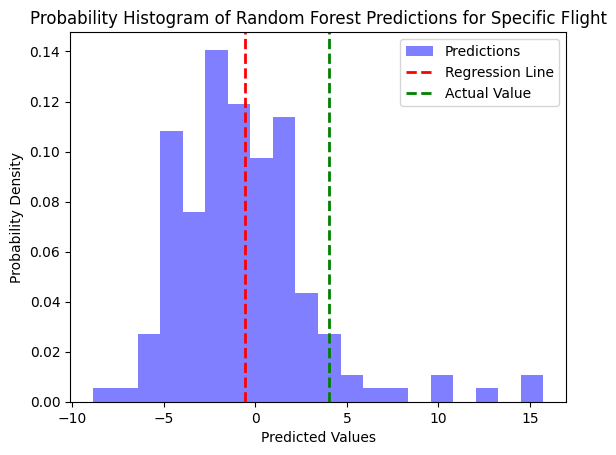

In [161]:
import matplotlib.pyplot as plt

# Sample one data point from X_test as a pandas DataFrame
input_data = X_test.sample(n=1, random_state=42)

# Display the selected random data point
print("Selected Random Data Point:")
print(input_data)

# Predictions
flight_prediction = RForregCV.predict(input_data)

# Get predictions from individual trees
tree_predictions = np.stack([tree.predict(input_data) for tree in RForregCV.estimators_])

# Combine predictions (mean for regression)
combined_predictions = np.mean(tree_predictions, axis=0)

# Plot a histogram of the combined predictions
plt.hist(tree_predictions, bins=20, density=True, alpha=0.5, color='blue', label='Predictions')
plt.axvline(x=flight_prediction, color='red', linestyle='dashed', linewidth=2, label='Regression Line')
# Plot the actual value
actual_value = Y_test.loc[input_data.index[0]]  # Assuming Y_test is a Series
plt.axvline(x=actual_value, color='green', linestyle='dashed', linewidth=2, label='Actual Value')
# Set x-axis limits
#plt.xlim(-30, 180)
plt.xlabel('Predicted Values')
plt.ylabel('Probability Density')
plt.title('Probability Histogram of Random Forest Predictions for Specific Flight')
plt.legend()
plt.show()


In [ ]:
for X_train, Y_train, X_test, Y_test, Y_train_meandev, Y_test_meandev, data_set in datasets:
    print("-------- Data Set", data_set, "--------")
    # Add a constant term for the intercept
    X_train = sm.add_constant(X_train)

    # Fit quantile regression model for the 0.5 quantile (median)
    quant_reg = sm.QuantReg(Y_train, X_train)
    quant_reg_results = quant_reg.fit(q=0.5)

    # Display the summary of the quantile regression
    print(quant_reg_results.summary())

    # Predict on the test set
    X_test = sm.add_constant(X_test)
    quantile_predictions = quant_reg_results.predict(X_test)

    # Plotting the actual values
    sns.scatterplot(x=Y_test.index, y=Y_test, label='Actual Values', color='blue')

    # Plotting the predicted median
    sns.lineplot(x=Y_test.index, y=quantile_predictions, label='Median Prediction', color='orange')

    # Plotting additional quantiles (e.g., 0.1 and 0.9)
    quantiles_to_plot = [0.1, 0.9]
    for quantile in quantiles_to_plot:
        # Fit quantile regression model
        quant_reg = sm.QuantReg(Y_train, X_train)
        quant_reg_results = quant_reg.fit(q=quantile)

        # Predict on the test set
        quantile_predictions = quant_reg_results.predict(X_test)

        # Plot the predicted quantile
        sns.lineplot(x=Y_test.index, y=quantile_predictions, label=f'{quantile} Quantile Prediction')

    # Set plot labels and title
    plt.xlabel('Index')
    plt.ylabel('DepDelay')
    plt.title('Quantile Regression Results')

    # Show legend
    plt.legend()

    # Show the plot
    plt.show()

## OLS

In [ ]:
for X_train, Y_train, X_test, Y_test, Y_train_meandev, Y_test_meandev, data_set in datasets:
    print("-------- Data Set ", data_set, "--------")
    lmCV = LinearRegression()
    param_grid = {
        'fit_intercept':[True,False]
    }
    CV_olsmodel = GridSearchCV(estimator=lmCV, param_grid=param_grid, cv=10)
    CV_olsmodel.fit(X_train, Y_train)
    print(CV_olsmodel.best_params_)
    lmCV = lmCV.set_params(**CV_olsmodel.best_params_)
    lmCV.fit(X_train, Y_train)
    Y_train_pred = lmCV.predict(X_train)
    Y_train_dev = sum((Y_train-Y_train_pred)**2)
    r2 = 1 - Y_train_dev/Y_train_meandev
    print("R2 =", r2)
    Y_test_pred = lmCV.predict(X_test)
    Y_test_dev = sum((Y_test-Y_test_pred)**2)
    pseudor2 = 1 - Y_test_dev/Y_test_meandev
    print("Pseudo-R2 =", pseudor2)
    report.loc[len(report)] = ['OLS RegressionCV', r2, pseudor2,
              CV_olsmodel.cv_results_['mean_test_score'][CV_olsmodel.best_index_],
              CV_olsmodel.cv_results_['std_test_score'][CV_olsmodel.best_index_], data_set]

In [ ]:
"""
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

for X_train, Y_train, X_test, Y_test, Y_train_meandev, Y_test_meandev, data_set in datasets:
  print("-------- Data Set ", data_set, "--------")
  RForregCV = RandomForestRegressor(random_state=0)
  param_grid = {
      'max_depth': [4],
      'n_estimators': [10]
      #'max_depth': [4, 5, 6, 7, 8],
      #'n_estimators': [10,  50,  100, 150, 200]
  }
  CV_rfmodel = GridSearchCV(estimator=RForregCV, param_grid=param_grid, cv=10)
  CV_rfmodel.fit(X_train, Y_train)
  print(CV_rfmodel.best_params_)
  RForregCV = RForregCV.set_params(**CV_rfmodel.best_params_)
  RForregCV.fit(X_train, Y_train)
  Y_train_pred = RForregCV.predict(X_train)
  Y_train_dev = sum((Y_train-Y_train_pred)**2)
  r2 = 1 - Y_train_dev/Y_train_meandev
  print("R2 =", r2)
  Y_test_pred = RForregCV.predict(X_test)
  Y_test_dev = sum((Y_test-Y_test_pred)**2)
  pseudor2 = 1 - Y_test_dev/Y_test_meandev
  print("Pseudo-R2 =", pseudor2)
  report.loc[len(report)] = ['Random ForestCV', r2, pseudor2,
            CV_rfmodel.cv_results_['mean_test_score'][CV_rfmodel.best_index_],
            CV_rfmodel.cv_results_['std_test_score'][CV_rfmodel.best_index_], data_set]
"""

# 4 Feature Selection

## 4.1 Pearson Correclation Matrix

## 4.2 Feature Elimination

# 5 Sampling